In [80]:
import pickle as pkl
import pandas as pd
import lightgbm as lgb
from scipy import stats
from scipy.stats import ttest_ind
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sys
sys.path.append("msc_thesis/hbac scripts")
import hbac_kmeans
from sklearn import metrics
import shap
from statistics import mean

# Loading in data
X_test_data = pd.read_pickle('data/X_test_data')
Y_test_data = pd.read_pickle('data/Y_test_data')
loaded_model = pkl.load(open('data/erv_model_beleggers_version_2022-02-18.pkl', 'rb'))
predictions = loaded_model.predict(X_test_data)


# SHAP on ERV outcome

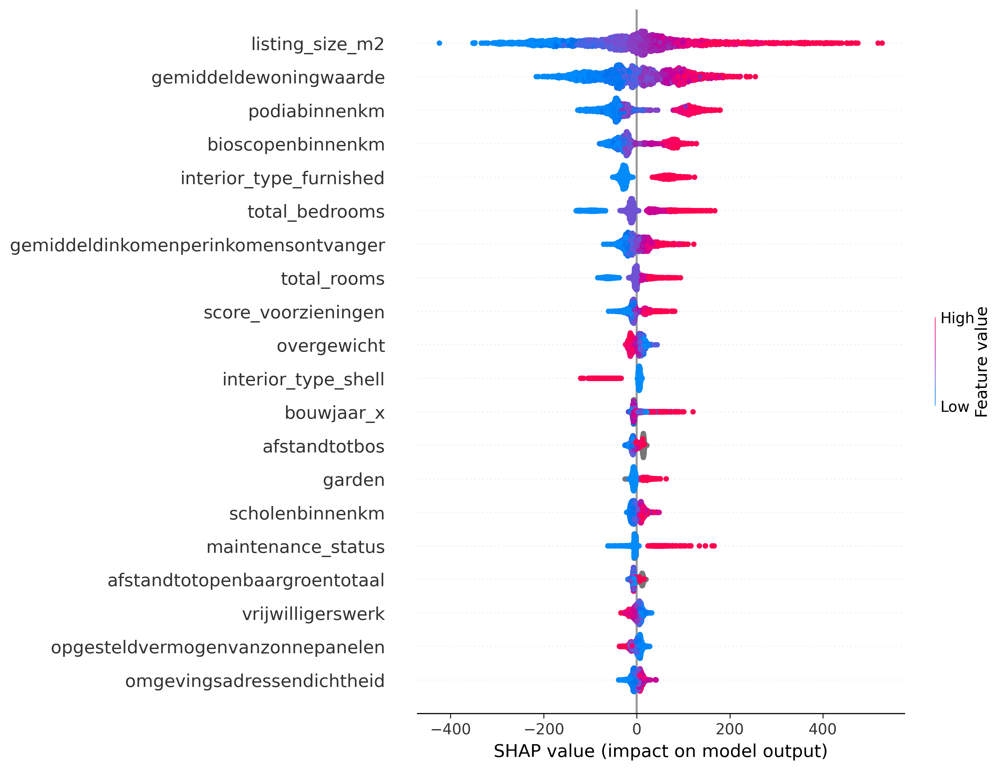

In [3]:
shap.initjs()
explainer = shap.TreeExplainer(loaded_model)
shap_values = explainer.shap_values(X_test_data)

shap.summary_plot(shap_values, features=X_test_data, feature_names=X_test_data.columns)
sorted_features = list(X_test_data.columns[np.argsort(np.abs(shap_values).mean(0))])[::-1]

# List of features sorted on importance is saved here
pkl.dump(sorted_features, open('sorted_features.pkl', 'wb'))

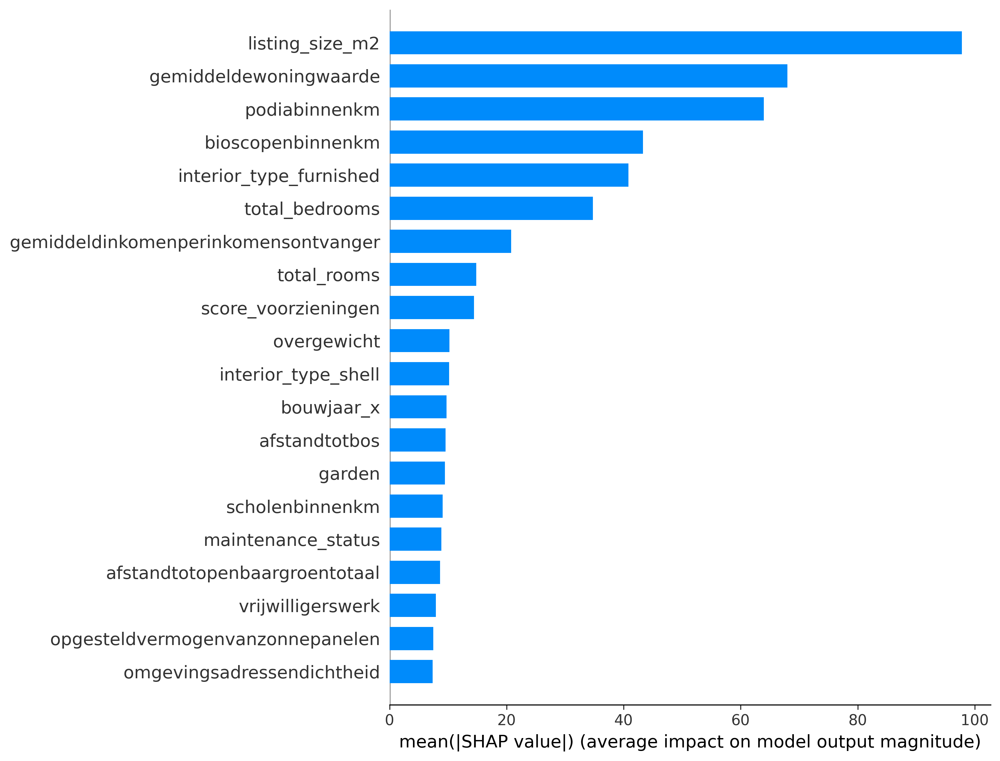

In [4]:
shap.summary_plot(shap_values, features=X_test_data, feature_names=X_test_data.columns, plot_type='bar')

# Missing values

In [82]:
df = X_test_data.copy()
df['predicted_value'] = predictions
df['true_value'] = Y_test_data
df['errors'] = df['predicted_value'] - df['true_value']
df['errors'] = df['errors'] / df['true_value']    # Make error relative
# print(len(df.columns),'Feature',len(df),'Instances')
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     print(df.isnull().sum())

In [6]:
import missingno as msno
# msno.heatmap(X_test_data)
# msno.matrix(X_test_data)
msno.bar(X_test_data)

<AxesSubplot:>

<AxesSubplot:>

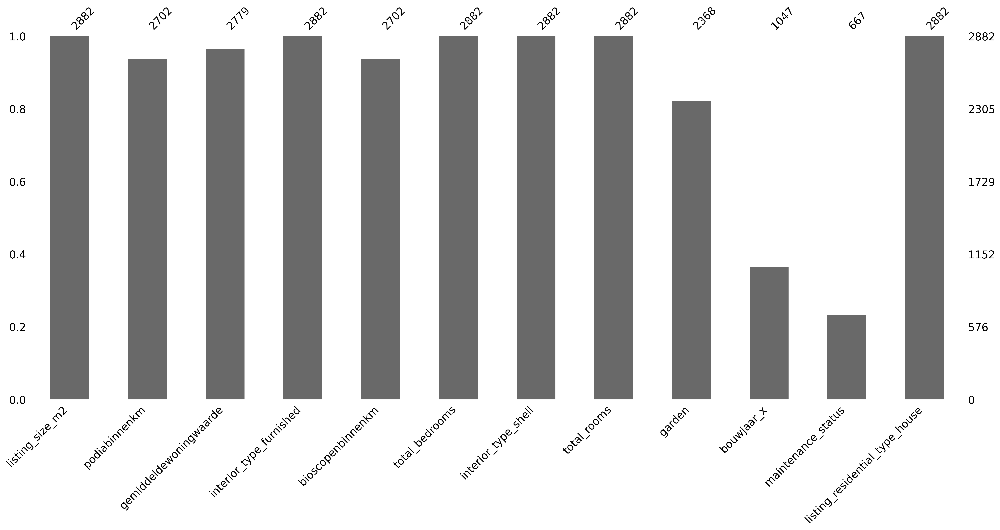

In [38]:
f = [x for x in relevant_features if x not in [ 'predicted_value','true_value','errors']]
msno.bar(X_test_data[f])

In [7]:
# relevant_features = [
#     # Top 12 most important
#     'listing_size_m2',
#     'gemiddeldewoningwaarde',
#     'podiabinnenkm',
#     'bioscopenbinnenkm',
#     'interior_type_furnished',
#     'total_bedrooms',
#     'gemiddeldinkomenperinkomensontvanger' ,
#     'total_rooms',
#     'score_voorzieningen',
#     'overgewicht', 
#     'interior_type_shell',
#     'bouwjaar_x',
    
#     # extra added, not in top importance features:
#     'listing_residential_type_house',
#     'garden',
#     #'maintenance_status', # deze heeft heel veel missing values
    
#     # Targets
#     'predicted_value',
#     'true_value',
#     'errors']

# ##  * are not included in current dataset 
# pd.to_pickle(relevant_features, "relevant_features.pkl")

In [161]:
relevant_features = [
    'listing_size_m2',
    'podiabinnenkm',
    'gemiddeldewoningwaarde',
    'interior_type_furnished',
    'bioscopenbinnenkm',
    'total_bedrooms',
    
    # lon*
    'interior_type_shell',
    # gemeente_totaal_aantal_banen*
    # lat??
    'total_rooms',
    # gemeente_bedrijfvestigingen*
    # score_voorzieningen
    # overgewicht
    'garden',
    # gemiddeldinkomenperinkomensontvanger
    'bouwjaar_x',
    # omgevingsadressendichtheid
    'maintenance_status', # deze heeft heel veel missing values
    # storage

    # extra added, not in top importance features:
    'listing_residential_type_house',

    
    
    # Targets
    'predicted_value',
    'true_value',
    'errors'
]

pd.to_pickle(relevant_features, "relevant_features.pkl")
# ##  * are not included in current dataset 

In [160]:
# X_test_data[relevant_features].isnull().sum().sum()

5027

In [150]:
# Descriptives per feature
u = []
missing = []
f = [x for x in relevant_features if x not in [ 'predicted_value','true_value','errors']]
for col in X_test_data[f].columns:
    cleanedList = [x for x in X_test_data[col] if str(x) != 'nan']
    u.append(len(set(cleanedList)))
    missing.append(X_test_data[col].isna().sum())
print(missing)

[0, 180, 103, 0, 180, 0, 0, 0, 514, 1835, 2215, 0]


In [167]:
df_describe = X_test_data[f].describe(include='all').T
df_describe['unique_values'] = u
df_describe['missing'] = missing
df_describe= df_describe.round(decimals=3)
display(df_describe)

with pd.option_context('display.precision', 2):
    df_describe_marked = df_describe.style.apply(lambda x: ['background: lightgreen' 
                                  if (x.unique_values < 15)
                                  else '' for i in x], axis=1)
    
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_describe_marked)

,count,mean,std,min,25%,50%,75%,max,unique_values,missing
listing_size_m2,2882.0,78.288,24.941,18.0,65.0,76.0,88.000,179.0,138,0
podiabinnenkm,2702.0,18.849,17.054,0.0,5.0,11.0,38.475,48.1,276,180
gemiddeldewoningwaarde,2779.0,293.642,153.410,79.0,188.0,259.0,365.000,1318.0,428,103
interior_type_furnished,2882.0,0.310,0.463,0.0,0.0,0.0,1.000,1.0,2,0
bioscopenbinnenkm,2702.0,6.860,5.233,0.0,2.0,5.0,13.125,16.7,130,180
total_bedrooms,2882.0,2.304,0.782,1.0,2.0,2.0,3.000,5.0,5,0
interior_type_shell,2882.0,0.066,0.248,0.0,0.0,0.0,0.000,1.0,2,0
total_rooms,2882.0,3.388,0.877,2.0,3.0,3.0,4.000,7.0,6,0
garden,2368.0,0.306,0.461,0.0,0.0,0.0,1.000,1.0,2,514
bouwjaar_x,1047.0,1957.971,63.916,1005.0,1928.0,1964.0,2001.000,2022.0,154,1835


,count,mean,std,min,25%,50%,75%,max,unique_values,missing
listing_size_m2,2882.00,78.29,24.94,18.00,65.00,76.00,88.00,179.00,138,0
podiabinnenkm,2702.00,18.85,17.05,0.00,5.00,11.00,38.48,48.10,276,180
gemiddeldewoningwaarde,2779.00,293.64,153.41,79.00,188.00,259.00,365.00,1318.00,428,103
interior_type_furnished,2882.00,0.31,0.46,0.00,0.00,0.00,1.00,1.00,2,0
bioscopenbinnenkm,2702.00,6.86,5.23,0.00,2.00,5.00,13.12,16.70,130,180
total_bedrooms,2882.00,2.30,0.78,1.00,2.00,2.00,3.00,5.00,5,0
interior_type_shell,2882.00,0.07,0.25,0.00,0.00,0.00,0.00,1.00,2,0
total_rooms,2882.00,3.39,0.88,2.00,3.00,3.00,4.00,7.00,6,0
garden,2368.00,0.31,0.46,0.00,0.00,0.00,1.00,1.00,2,514
bouwjaar_x,1047.00,1957.97,63.92,1005.00,1928.00,1964.00,2001.00,2022.00,154,1835


In [9]:
## IMPUTING MISSING VALUES

### Using miceforest for multiple imputation https://pypi.org/project/miceforest/
import miceforest as mf


# Create kernel. 
kds = mf.ImputationKernel(
  df[relevant_features],
  datasets=3,

  mean_match_candidates=5,    # 

  save_all_iterations=True,
  random_state=66,
)

# Run the MICE algorithm for 3 iterations on each of the datasets
kds.mice(2)


completed_dataset = kds.complete_data(dataset=0, inplace=False)

### Save completed dataset
pd.to_pickle(completed_dataset, "completed_dataset.pkl")

# # Fill missing values with column median
# for col in df.select_dtypes(include=np.number):
#     df[col] = df[col].fillna(df[col].median())  

In [10]:
## Get list of most important features according to SHAP on ERV model
sorted_features = pkl.load(open('sorted_features.pkl', 'rb'))


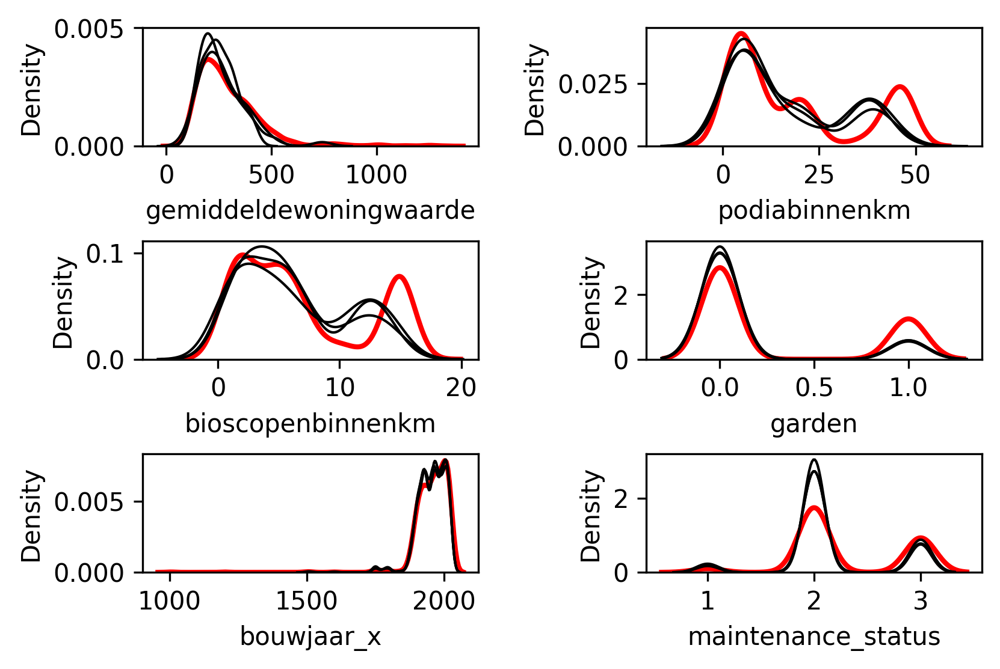

In [11]:
feature_with_missing_values = df.columns[df.isnull().any()]

## Get list of features with missing values to plot imputation results
# plot_features = [x for x in sorted_features if x in feature_with_missing_values]

plot_features = [x for x in relevant_features if x in feature_with_missing_values]


# only plot 10 (most important) features to keep it simple
#plot_features = plot_features[:10]


kds.plot_imputed_distributions(variables = plot_features[:] ,iteration = 2, wspace=0.5, hspace=0.8)
# kds.plot_imputed_distributions(variables = plot_features[:6] ,iteration = 5, wspace=0.5, hspace=0.8)
# kds.plot_imputed_distributions(variables = [plot_features[6]] ,iteration = 5, wspace=0.5, hspace=0.8)

# Imputing total dataset

In [ ]:
df = X_test_data.copy()
df['predicted_value'] = predictions
df['true_value'] = Y_test_data
df['errors'] = df['predicted_value'] - df['true_value']
df['errors'] = df['errors'] / df['true_value']    # Make error relative
# print(len(df.columns),'Feature',len(df),'Instances')
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     print(df.isnull().sum())

In [58]:
# Create kernel. 
kernel_full = mf.ImputationKernel(
  df,
    
  mean_match_candidates=10,    # 

  datasets=3,
  save_all_iterations=True,
  random_state=66
)

# Run the MICE algorithm for 3 iterations on each of the datasets
kernel_full.mice(5)#check 5 vs 3
completed_dataset = kernel_full.complete_data(dataset=0, inplace=False)

### Save completed dataset
pd.to_pickle(completed_dataset, "full_db_completed_dataset.pkl")
 

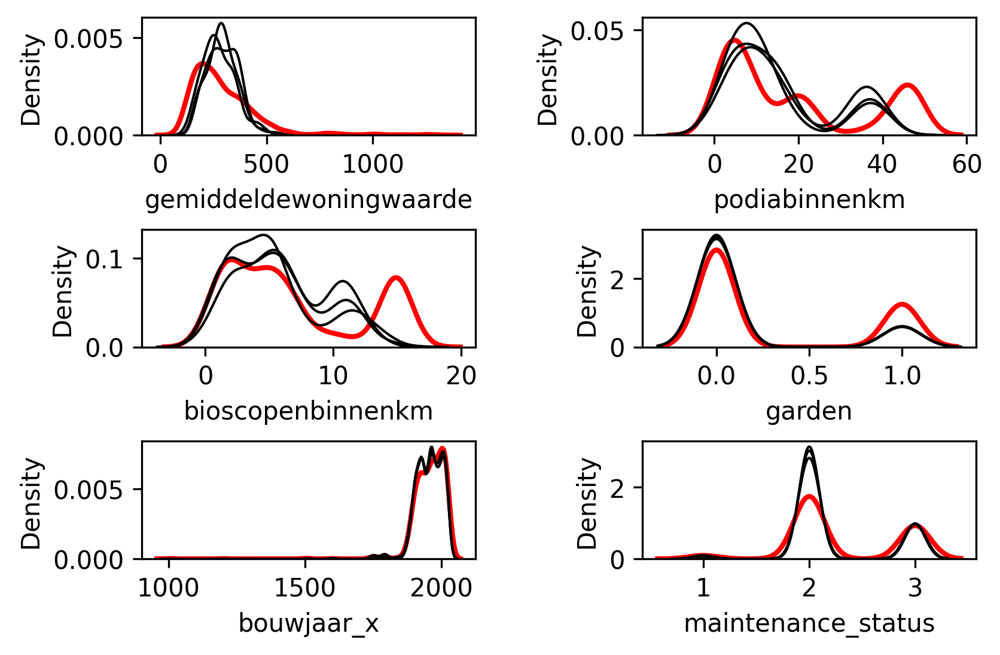

In [59]:
feature_with_missing_values = df.columns[df.isnull().any()]

## Get list of features with missing values to plot imputation results
# plot_features = [x for x in sorted_features if x in feature_with_missing_values]

plot_features = [x for x in relevant_features if x in feature_with_missing_values]

# only plot 10 (most important) features to keep it simple
#plot_features = plot_features[:10]

kernel_full.plot_imputed_distributions(variables = plot_features[:] ,iteration = 2, wspace=0.5, hspace=0.8)
# kernel_full.plot_imputed_distributions(variables = [plot_features[6]] ,iteration = 5, wspace=0.5, hspace=0.8)

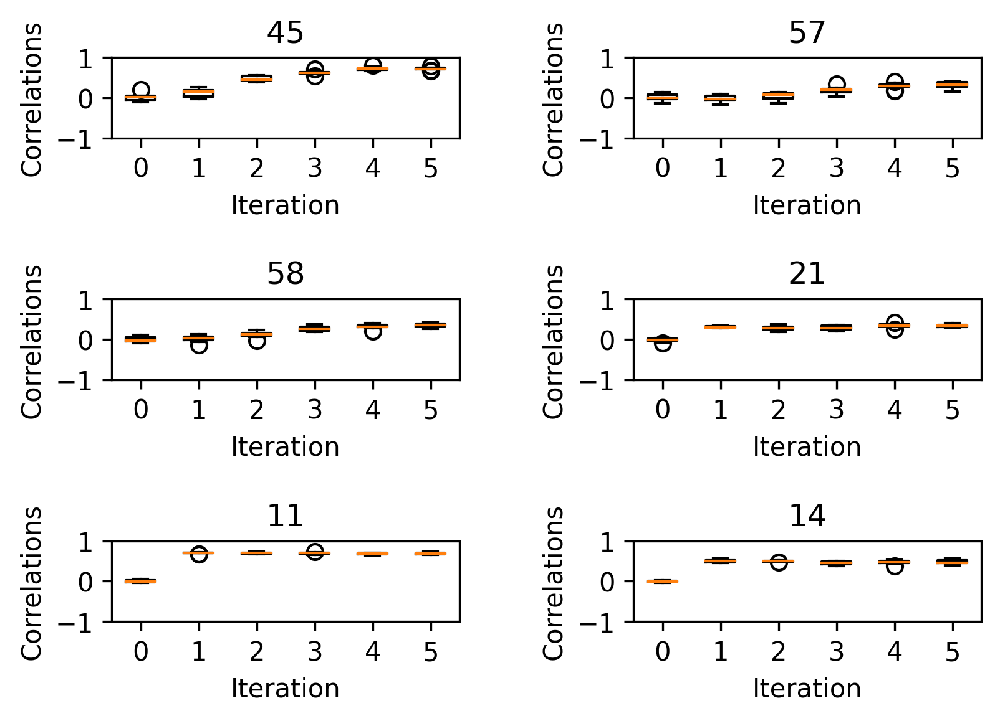

In [138]:
#### TODO: FIX these plots

# kds.plot_correlations(variables = plot_features, wspace=0.5,hspace=2)

#kds.plot_feature_importance(0, annot=False,cmap="YlGnBu",vmin=0, vmax=10) 
# kds.plot_mean_convergence(variables = plot_features , wspace=1, hspace=2)

# HBAC multiple times

In [84]:
#### Load completed dataset
# df = pd.read_pickle('completed_dataset.pkl')
df = pd.read_pickle('full_db_completed_dataset.pkl')
df = df[relevant_features]

### TODO Effect of clustering on abs error instead???
# df['errors'] = abs(df['errors'])

In [154]:
len(df[df['maintenance_status']==1])
len(df['maintenance_status'])

2882

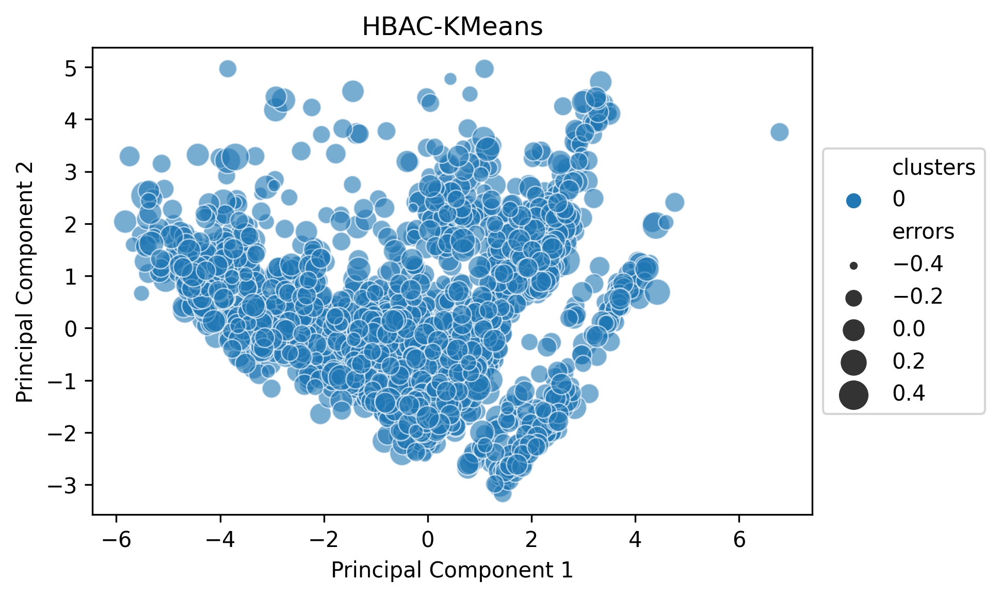

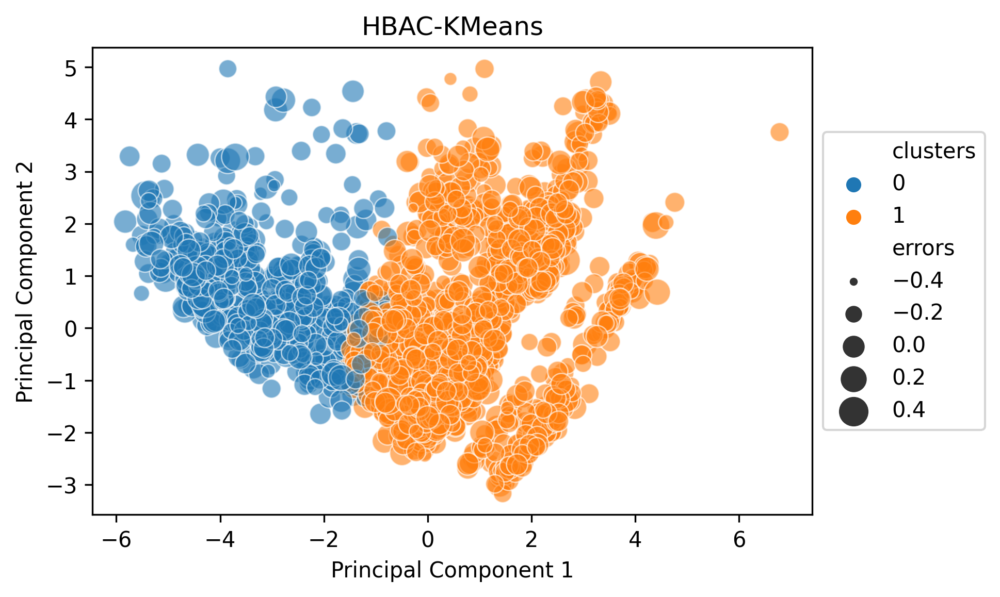

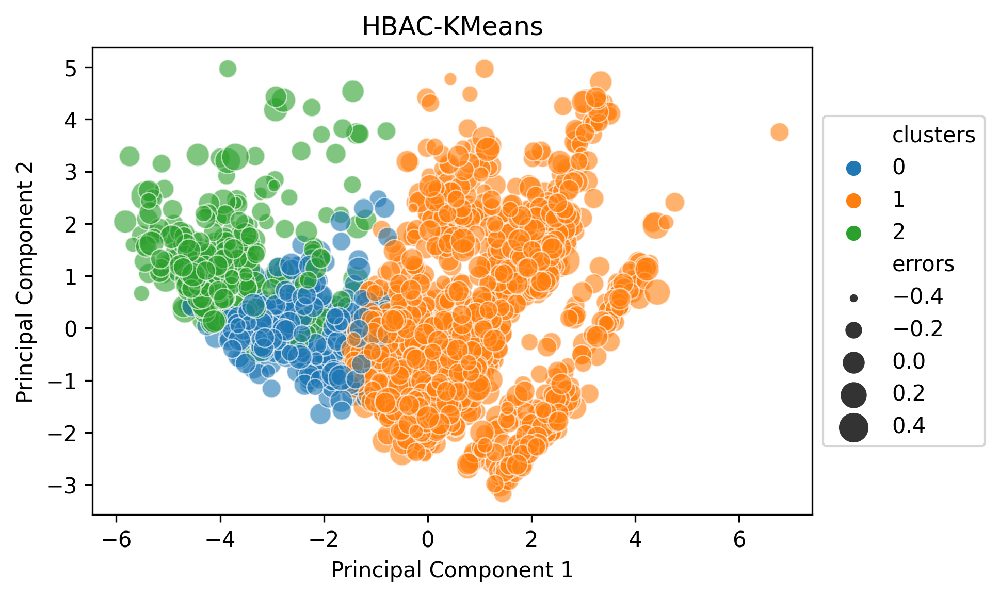

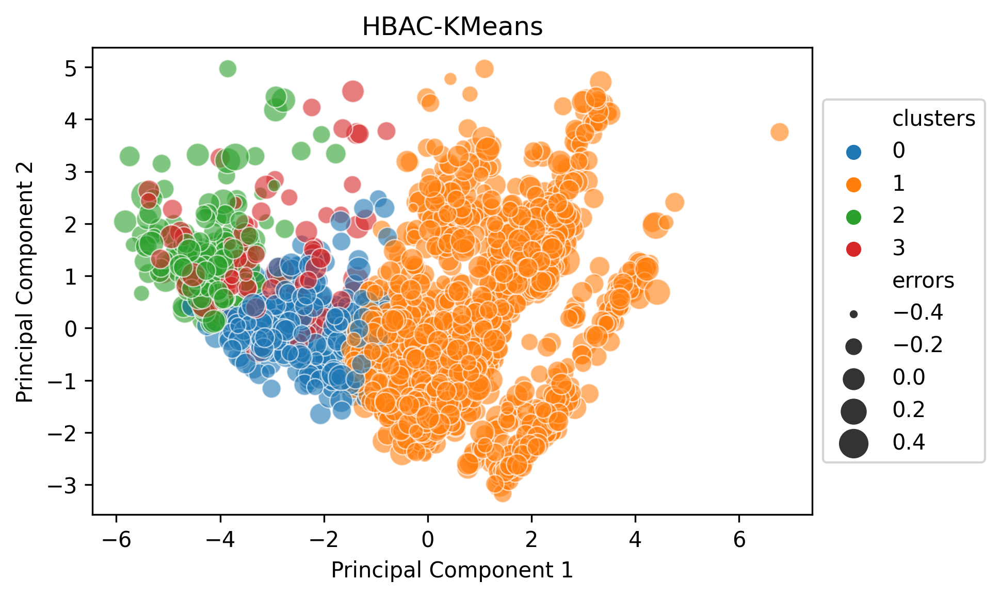

,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.984,0.129,0.855,6.633,77.085,0.000
garden,1.000,0.223,0.777,3.492,96.927,0.000
errors,0.033,0.012,0.021,1.820,2.048,0.042
total_bedrooms,3.963,2.187,1.777,0.813,53.141,0.000
interior_type_shell,0.016,0.069,-0.053,0.773,-5.205,0.000
podiabinnenkm,6.675,19.096,-12.421,0.650,-18.263,0.000
listing_size_m2,122.330,75.162,47.167,0.628,31.692,0.000
total_rooms,5.199,3.259,1.940,0.595,54.475,0.000
bioscopenbinnenkm,2.908,6.960,-4.052,0.582,-17.229,0.000
predicted_value,1547.097,1405.767,141.331,0.101,5.120,0.000


,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.984293,0.128948,0.855345,6.633236,77.085046,0.000000
garden,1.000000,0.222594,0.777406,3.492487,96.926732,0.000000
errors,0.032893,0.011666,0.021227,1.819640,2.048263,0.041800
total_bedrooms,3.963351,2.186548,1.776803,0.812607,53.140645,0.000000
interior_type_shell,0.015707,0.069119,-0.053412,0.772758,-5.205394,0.000000
podiabinnenkm,6.674869,19.096024,-12.421155,0.650458,-18.262769,0.000000
listing_size_m2,122.329843,75.162393,47.167450,0.627541,31.692099,0.000000
total_rooms,5.198953,3.259383,1.939570,0.595073,54.475148,0.000000
bioscopenbinnenkm,2.907853,6.959792,-4.051938,0.582192,-17.228798,0.000000
predicted_value,1547.097465,1405.766741,141.330724,0.100536,5.119785,0.000001


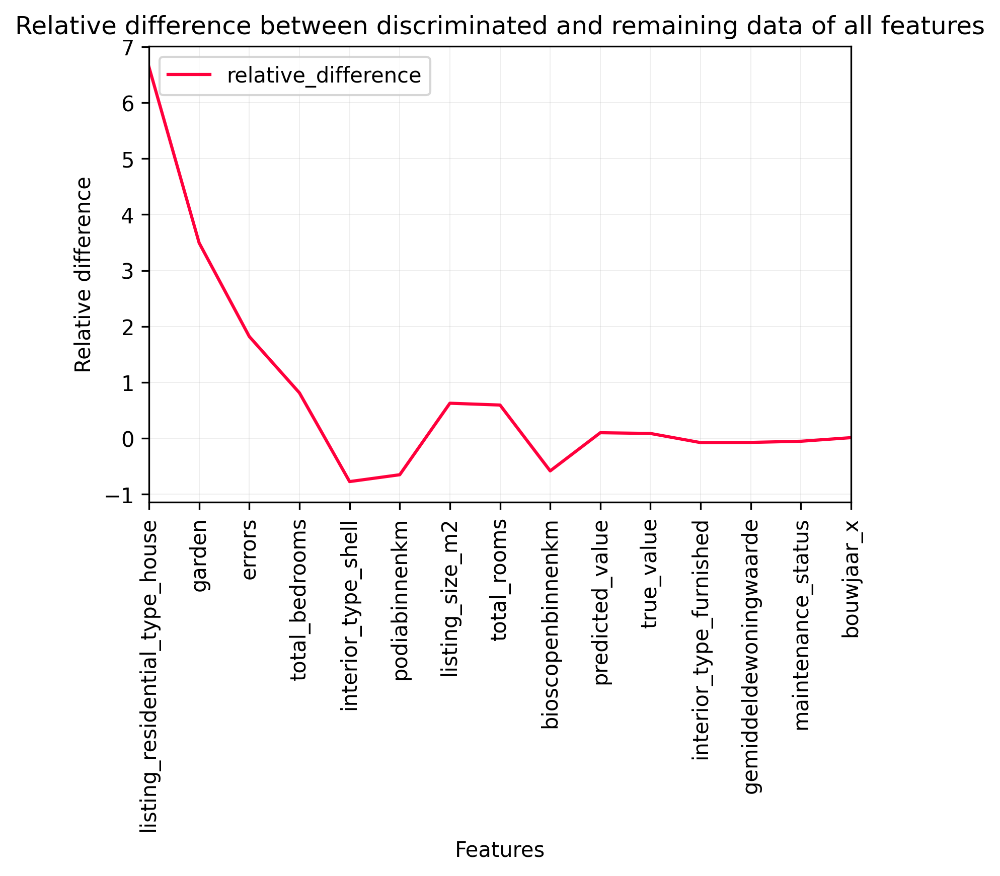

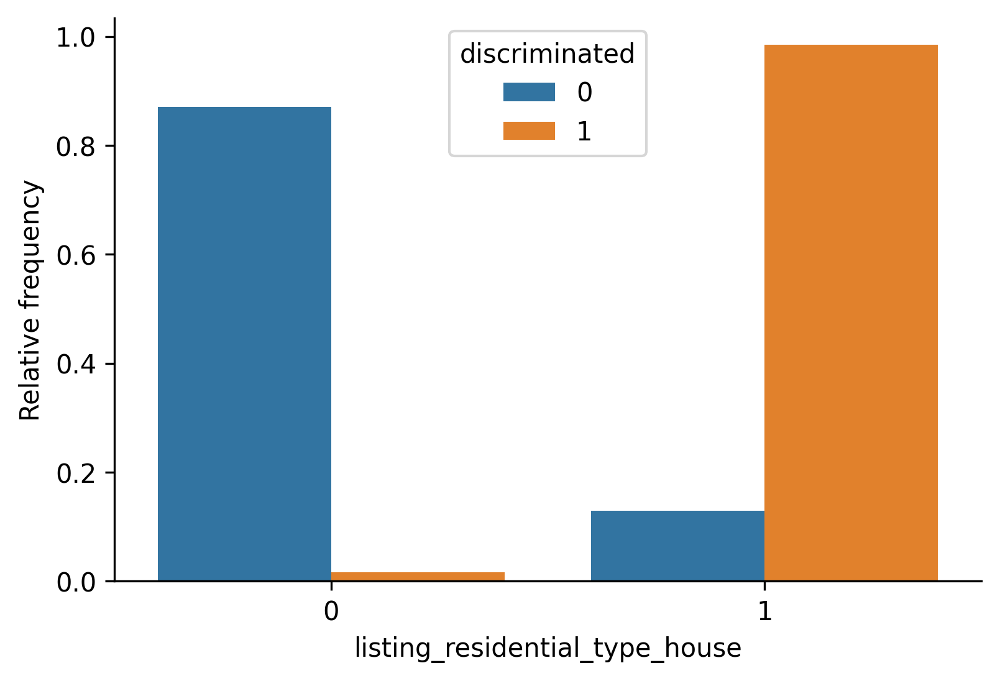

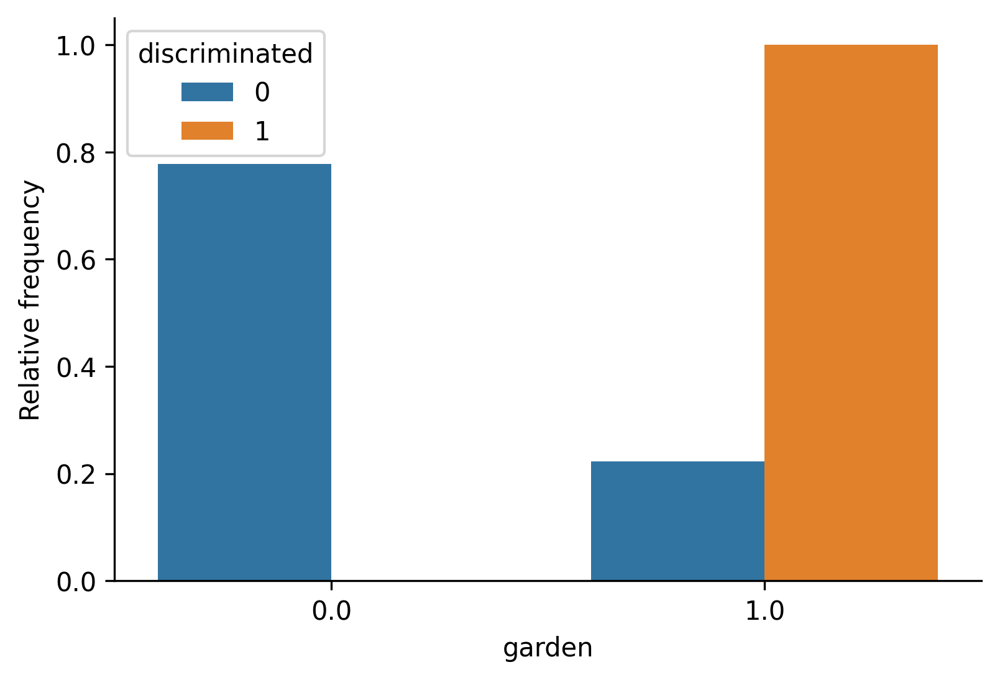

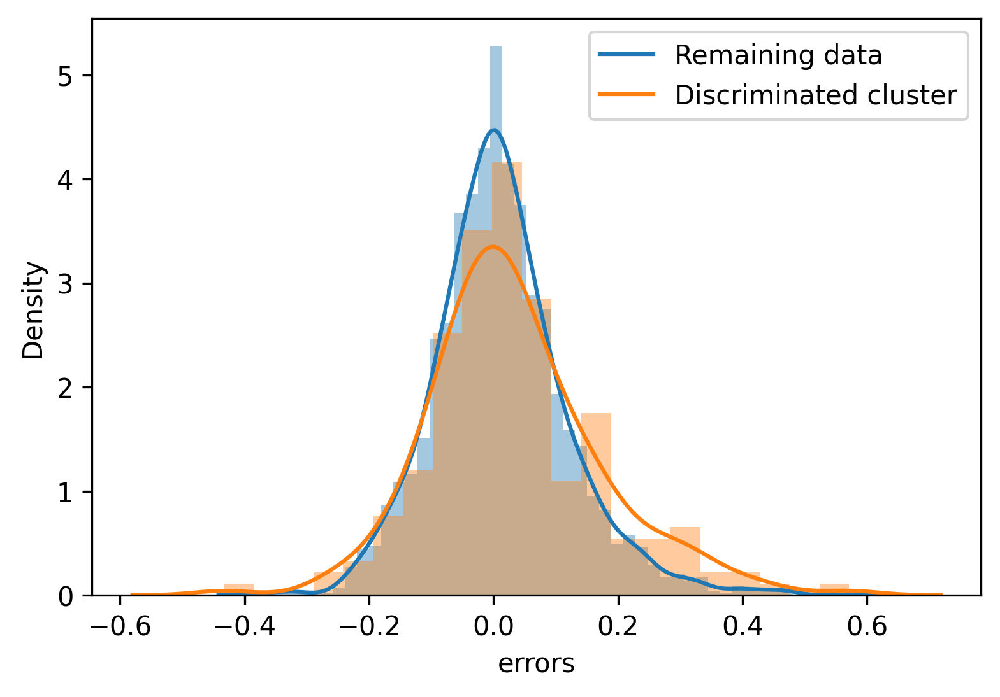

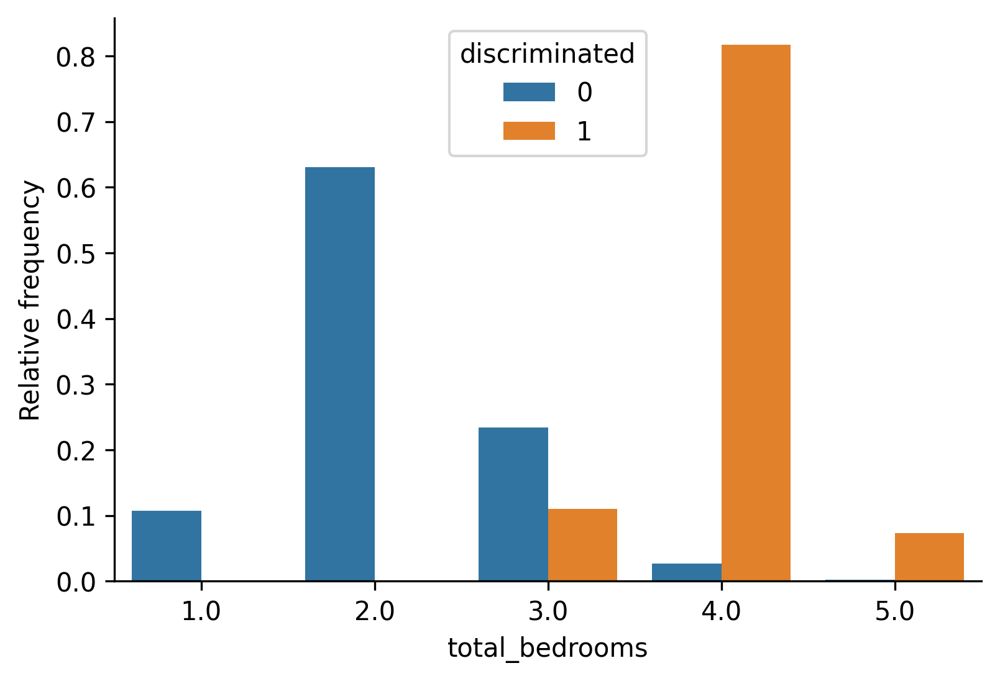

...

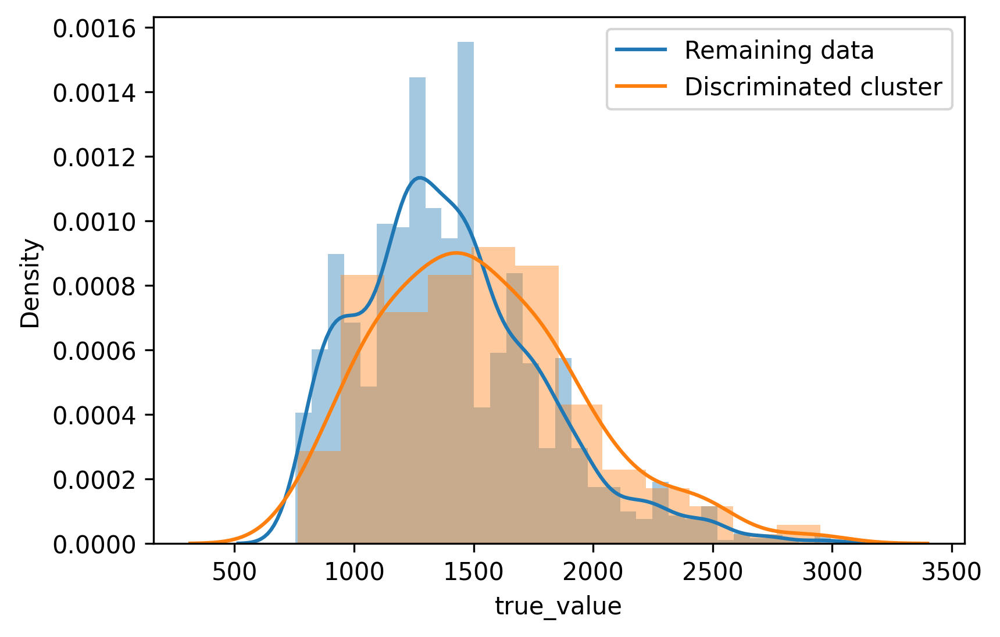

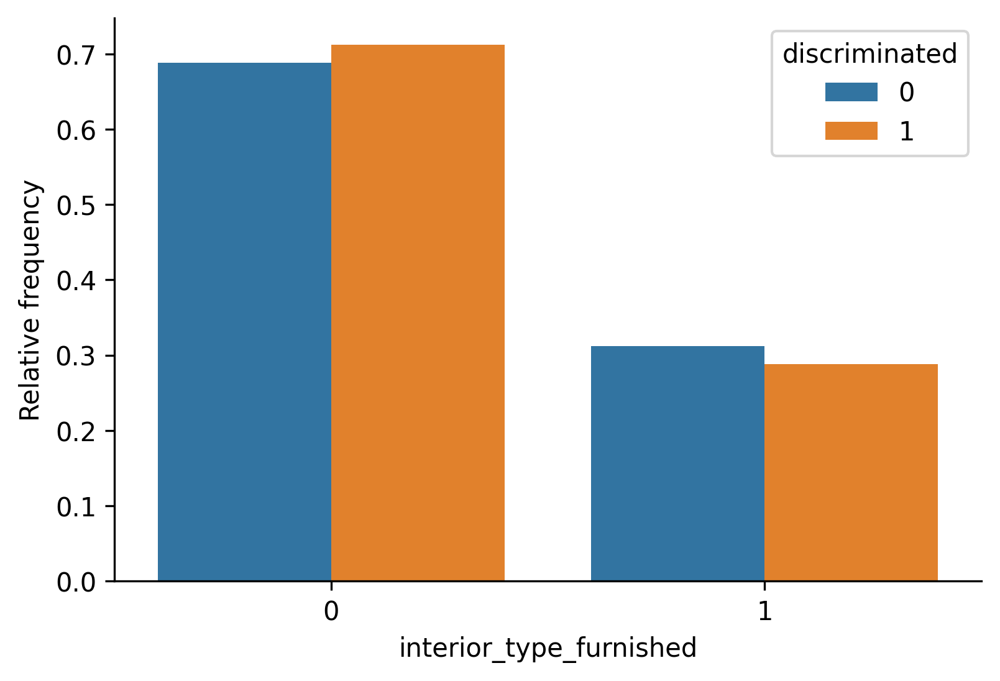

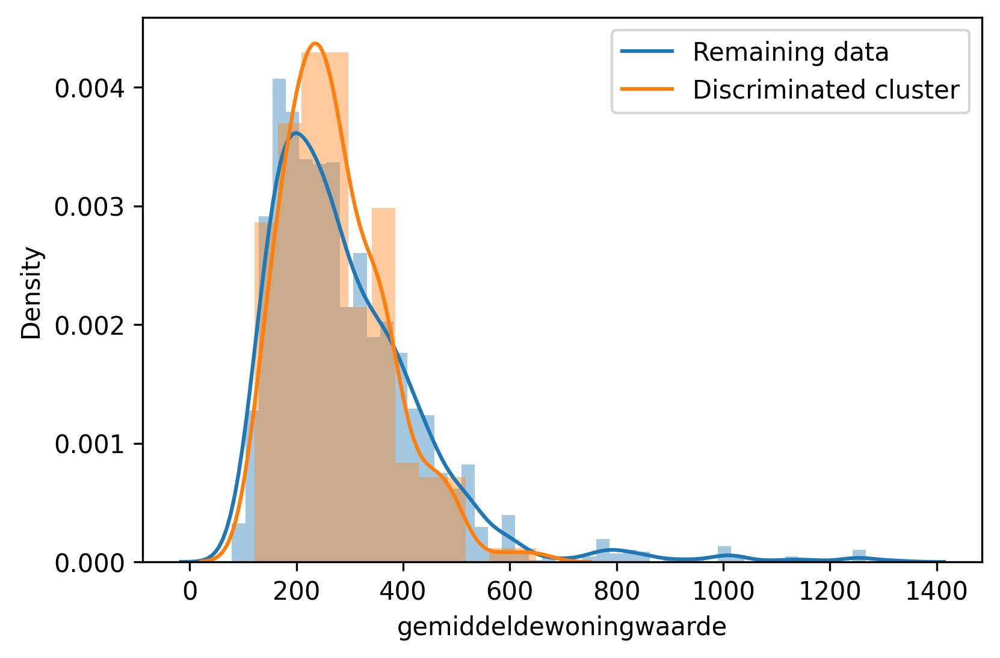

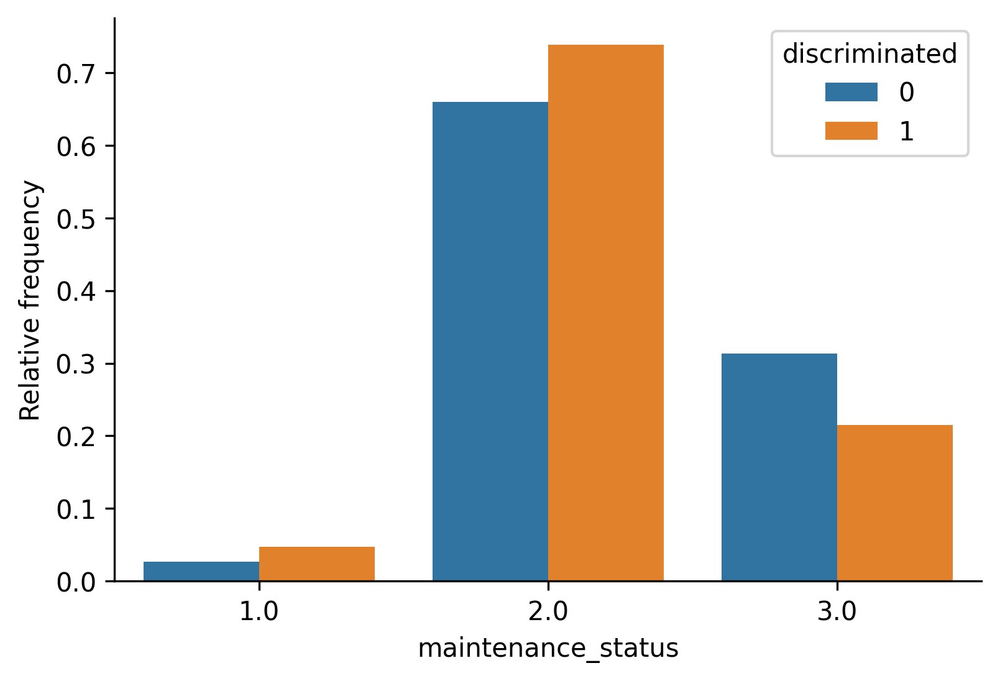

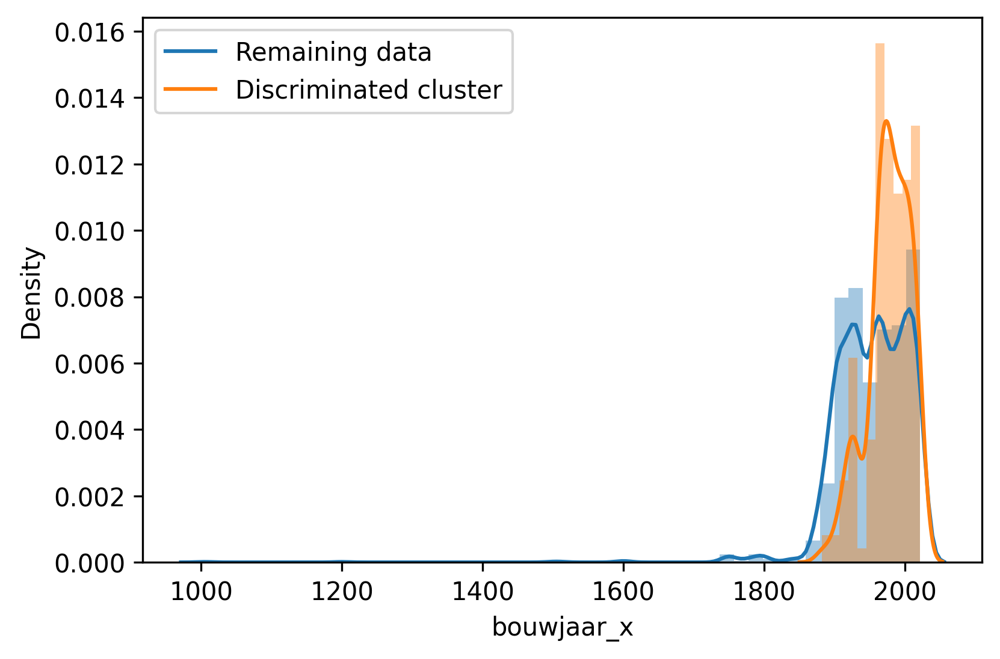

Averages results of 1 runs of HBAC
Average maximun negative biased cluster:  -0.10769496446492943 ± 0.0 , min= -0.10769496446492943
Average number of clusters:  4 ± 0.0
Average Sillhouette score:  0.19688588193634476 ± 0.0 , max= 0.19688588193634476


In [176]:
# Number of times to run HBAC.
num_runs = 1

avg_bias = []
avg_sillh = []
avg_number_of_clusters = []
for run_i in range(1, num_runs+1):
    results = hbac_kmeans.hbac_kmeans(df, 0.8, show_plot=True)
    c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
    avg_bias.append(max_neg_bias)
    avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                          results['clusters']))
    avg_number_of_clusters.append(len(results['clusters'].unique()) )
    discriminated_cluster = results[results['clusters']==c]
    unscaled_discriminated = df.loc[discriminated_cluster.index, :]
    unscaled_remaining = df.drop(discriminated_cluster.index)
    if run_i == 1:
        all_unscaled_discriminated = unscaled_discriminated.copy()
        all_unscaled_remaining = unscaled_remaining.copy()
    else:
        all_unscaled_discriminated = pd.concat([all_unscaled_discriminated, unscaled_discriminated])
        all_unscaled_remaining = pd.concat([all_unscaled_remaining, unscaled_remaining])
        
significant_features = []
welch_T = []
p_values = []

# Welch's test for differences discrimninated vs remaining data
significant_features = []
welch_T = []
p_values = []
for i in all_unscaled_remaining:
    welch_i = stats.ttest_ind(all_unscaled_discriminated[i], all_unscaled_remaining[i], equal_var=False)
    welch_T.append(welch_i.statistic)
    p_values.append(welch_i.pvalue)
    if welch_i.pvalue <= 0.05:
        significant_features.append(i)
mean_clusters = pd.DataFrame()
mean_clusters['unscaled_discriminated_mean'] = all_unscaled_discriminated.mean()
mean_clusters['unscaled_remaining_mean'] = all_unscaled_remaining.mean()
mean_clusters['difference'] = mean_clusters['unscaled_discriminated_mean'] - mean_clusters['unscaled_remaining_mean']
mean_clusters['abs_relative_difference'] = abs(mean_clusters['difference'])
mean_clusters['abs_relative_difference'] = mean_clusters['abs_relative_difference']/mean_clusters['unscaled_remaining_mean']
mean_clusters['welch_statistic'] = welch_T
mean_clusters['p_value'] = p_values
# SORT ON: absolute relative mean difference between means
mean_clusters = mean_clusters.sort_values(by='abs_relative_difference',ascending=False)
df_marked = mean_clusters.style.apply(lambda x: ['background: lightgreen' 
                                  if (x.name in significant_features)
                                  else '' for i in x], axis=1)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(mean_clusters.round(decimals=3))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_marked)
# creating df for parallel coordinate plot
df_parallel = mean_clusters.copy()
df_parallel['relative_difference'] = df_parallel['difference'] / df_parallel['unscaled_remaining_mean']
df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','difference','abs_relative_difference','welch_statistic','p_value'],axis=1,inplace=True)
# df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','difference','welch_statistic','p_value'],axis=1,inplace=True)
df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(df_parallel_transpose.head())
# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=10)
    plt.legend(loc="upper left")
    plt.xlabel("Features")
    plt.ylabel("Relative difference")
    plt.grid(linewidth=0.1)
    plt.title(title)
    plt.show()
create_parallel_coord_plot(df_parallel_transpose, "Relative difference between discriminated and remaining data of all features")

##### Plot distribution discriminated cluster vs remaining data
unscaled_remaining = all_unscaled_remaining.copy()
unscaled_discriminated = all_unscaled_discriminated.copy()
unscaled_discriminated['discriminated'] = 1
unscaled_remaining['discriminated'] = 0
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])
features_sorted = list(mean_clusters.T.columns)
features_sorted.extend(['discriminated'])
unscaled_combined = unscaled_combined[features_sorted]
pd.to_pickle(unscaled_combined, "all_unscaled_combined.pkl")
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])
for col in mean_clusters.T.columns:
    if len(unscaled_remaining[col].unique()) > 15:
        fig, ax = plt.subplots()
        for a in [unscaled_remaining[col], unscaled_discriminated[col]]:
            sns.distplot(a, ax=ax)
            plt.legend(labels=["Remaining data","Discriminated cluster"])
        plt.show()
    # Quick fix to enter categorical
    if len(unscaled_remaining[col].unique())<= 15 and col !='discriminated':
#######         For percentage of Discriminated data per category
#         fig, ax = plt.subplots()
#         sns.barplot(x=col,y='Discriminated',  data=unscaled_combined, ax=ax,color='#3b75af')
#         sns.despine(fig)
#         plt.show()
####### Difference in relative count, #Used plot https://stackoverflow.com/questions/57024583/countplot-with-relative-frequencies-or-density-curves
        fig, ax = plt.subplots()
        relative_count = (unscaled_combined.groupby(['discriminated',col]).size() / 
                          unscaled_combined.groupby(['discriminated']).size()).reset_index().rename({0:'Relative frequency'}, axis=1)
        sns.barplot(x=col, hue='discriminated', y='Relative frequency', data=relative_count, ax=ax)
        sns.despine(fig)
        plt.show()

print('Averages results of {} runs of HBAC'.format(num_runs))
print('Average maximun negative biased cluster: ', mean(avg_bias), '±', np.std(avg_bias), ', min=', min(avg_bias))
print('Average number of clusters: ', mean(avg_number_of_clusters), '±',np.std(avg_number_of_clusters))
print('Average Sillhouette score: ', mean(avg_sillh),'±', np.std(avg_sillh),', max=', max(avg_sillh))

In [ ]:
Averages results of 1 runs of HBAC
Average maximun negative biased cluster:  -0.10971547332258258 ± 0.0 , min= -0.10971547332258258
Average number of clusters:  4 ± 0.0
Average Sillhouette score:  0.19581264021702965 ± 0.0 , max= 0.19581264021702965

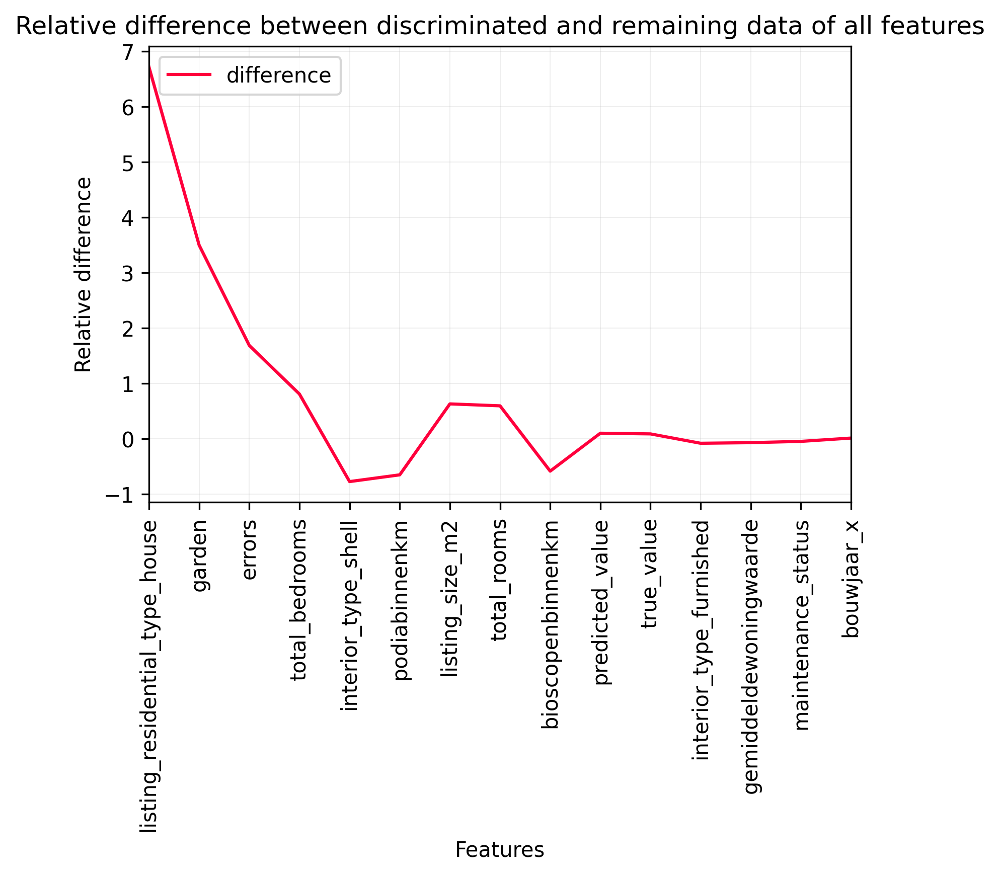

In [105]:
# creating df for parallel coordinate plot
df_parallel = mean_clusters.copy()
df_parallel['difference'] = df_parallel['difference'] / df_parallel['unscaled_remaining_mean']


df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','abs_relative_difference','welch_statistic','p_value'],axis=1,inplace=True)
# df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','difference','welch_statistic','p_value'],axis=1,inplace=True)
df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(df_parallel_transpose.head())
# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=10)
    plt.legend(loc="upper left")
    plt.xlabel("Features")
    plt.ylabel("Relative difference")
    plt.grid(linewidth=0.1)
    plt.title(title)
    plt.show()
create_parallel_coord_plot(df_parallel_transpose, "Relative difference between discriminated and remaining data of all features")


In [97]:
#### SAVE DB ONLY FOR XGB ANALYSIS: WATCH OVERWRITE
pd.to_pickle(unscaled_combined, "unscaled_combined.pkl")

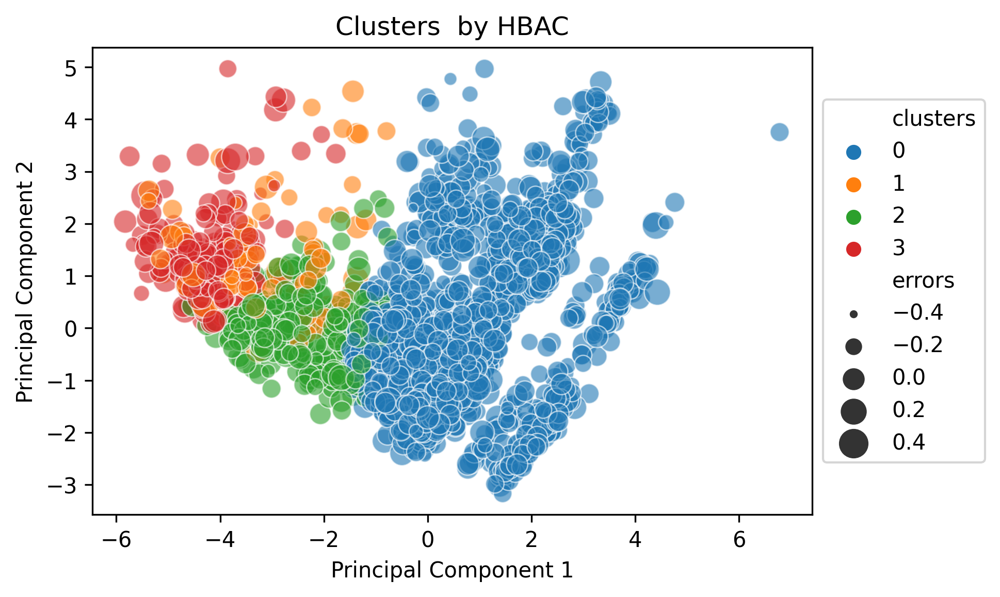

0 has bias 0.06522486097155522
3 has bias -0.10971547332258258
1 has bias -0.0016982125623483668
2 has bias -0.09154075640364223
cluster with the highest discriminating bias: 3
Cluster  3 Bias  -0.10971547332258258 

R2 this dataset: 0.844
R2 of discriminated cluster: 0.742
R2 of remaining clusters: 0.851
Number of instances in discriminated cluster: 192

 Silhouete score:  0.196


In [101]:
import hbac_utils
hbac_utils.pca_plot(results,'Clusters  by HBAC',0.6)
c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results, printing=True)
print('Cluster ', c,'Bias ', max_neg_bias,'\n')
r2_full_data = hbac_kmeans.accuracy(results)
highest_biased_cluster = results[results['clusters']==c]
remaining_data = results[results['clusters']!=c]
r2_highest_biased_cluster = hbac_kmeans.accuracy(highest_biased_cluster)
r2_remaining_data = hbac_kmeans.accuracy(remaining_data)
print('R2 this dataset:', round(r2_full_data,3))
print('R2 of discriminated cluster:', round(r2_highest_biased_cluster,3))
print('R2 of remaining clusters:', round(r2_remaining_data,3))
discriminated_cluster = results[results['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
silh = metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                              results['clusters'])
print('\n', 'Silhouete score: ', round(silh,3))

In [93]:
# No abs error taken

# Averages results of 50 runs of HBAC 
# Average maximun negative biased cluster:  -0.07706322013359918 ± 0.014642982911295519 , min= -0.10877122937331318
# Average number of clusters:  2.96 ± 0.9789790600416334
# Average Sillhouette score:  0.2434568589493567 ± 0.042122913280918294 , max= 0.28562120569756616

,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.892972,0.096441,0.796531,8.259241,438.339204,0.000000e+00
garden,0.857802,0.200513,0.657289,3.278030,313.130934,0.000000e+00
errors,0.023624,0.011742,0.011882,1.011948,15.509866,4.366344e-54
podiabinnenkm,6.636276,19.740177,-13.103901,0.663819,-234.651124,0.000000e+00
total_bedrooms,3.550973,2.147100,1.403873,0.653846,355.716115,0.000000e+00
bioscopenbinnenkm,2.960783,7.161661,-4.200878,0.586579,-221.121513,0.000000e+00
listing_size_m2,113.854890,73.803472,40.051418,0.542677,306.507791,0.000000e+00
total_rooms,4.781173,3.212239,1.568933,0.488423,359.672039,0.000000e+00
interior_type_furnished,0.241107,0.318914,-0.077807,0.243975,-30.474778,8.414683e-202
gemiddeldewoningwaarde,262.128285,297.403942,-35.275657,0.118612,-56.093678,0.000000e+00


,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.892972,0.096441,0.796531,8.259241,438.339204,0.000000
garden,0.857802,0.200513,0.657289,3.278030,313.130934,0.000000
errors,0.023624,0.011742,0.011882,1.011948,15.509866,0.000000
podiabinnenkm,6.636276,19.740177,-13.103901,0.663819,-234.651124,0.000000
total_bedrooms,3.550973,2.147100,1.403873,0.653846,355.716115,0.000000
bioscopenbinnenkm,2.960783,7.161661,-4.200878,0.586579,-221.121513,0.000000
listing_size_m2,113.854890,73.803472,40.051418,0.542677,306.507791,0.000000
total_rooms,4.781173,3.212239,1.568933,0.488423,359.672039,0.000000
interior_type_furnished,0.241107,0.318914,-0.077807,0.243975,-30.474778,0.000000
gemiddeldewoningwaarde,262.128285,297.403942,-35.275657,0.118612,-56.093678,0.000000


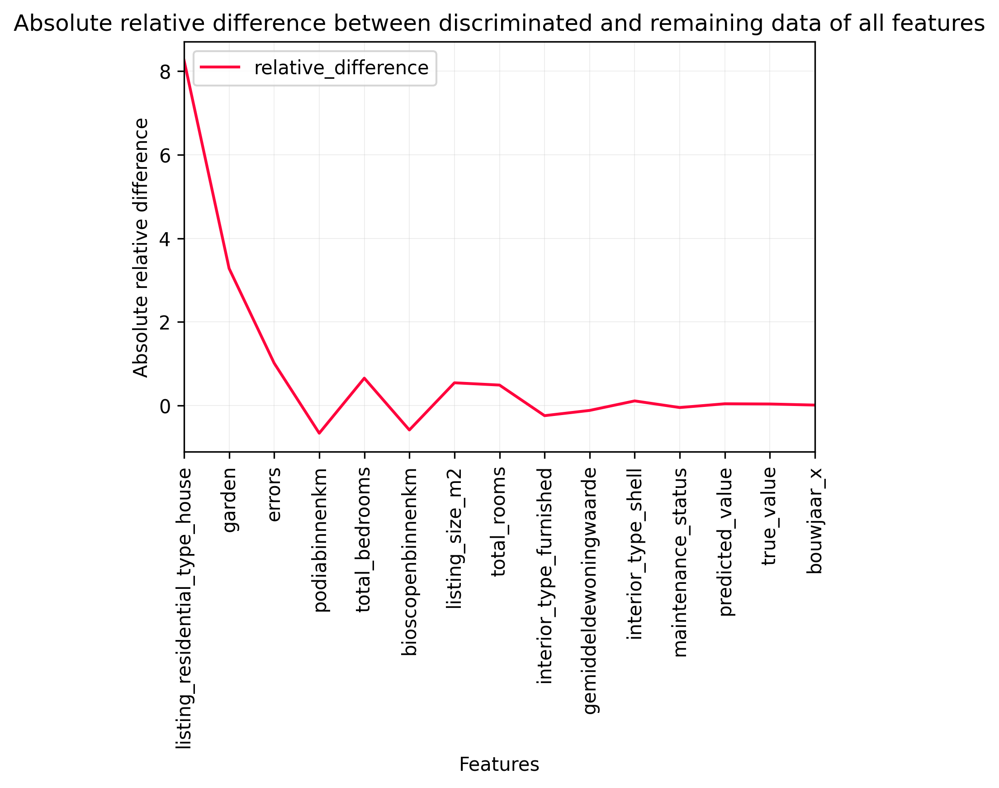

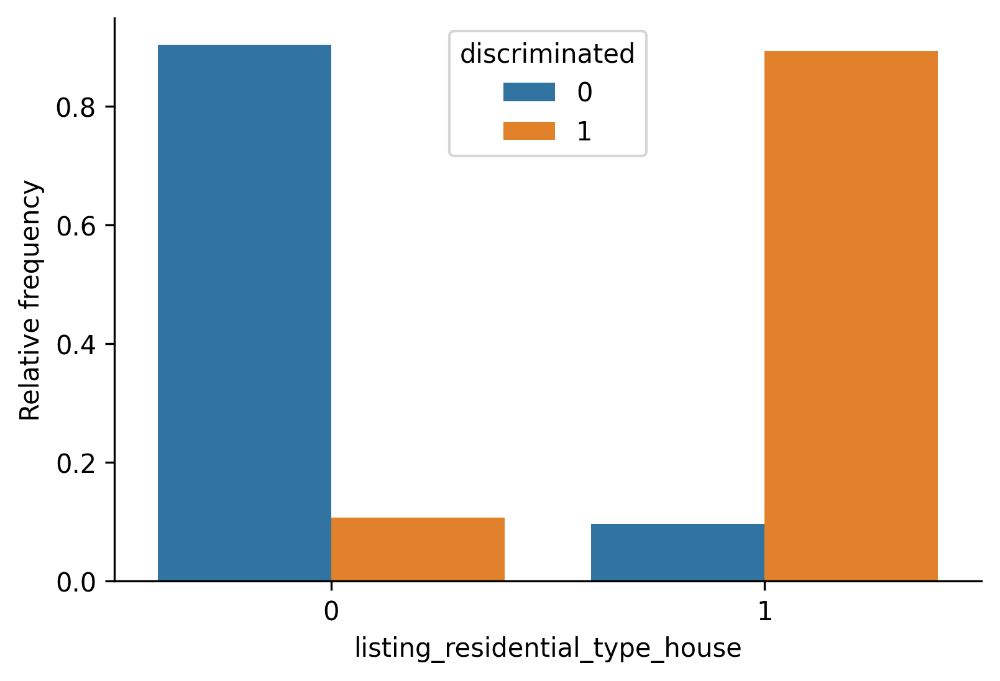

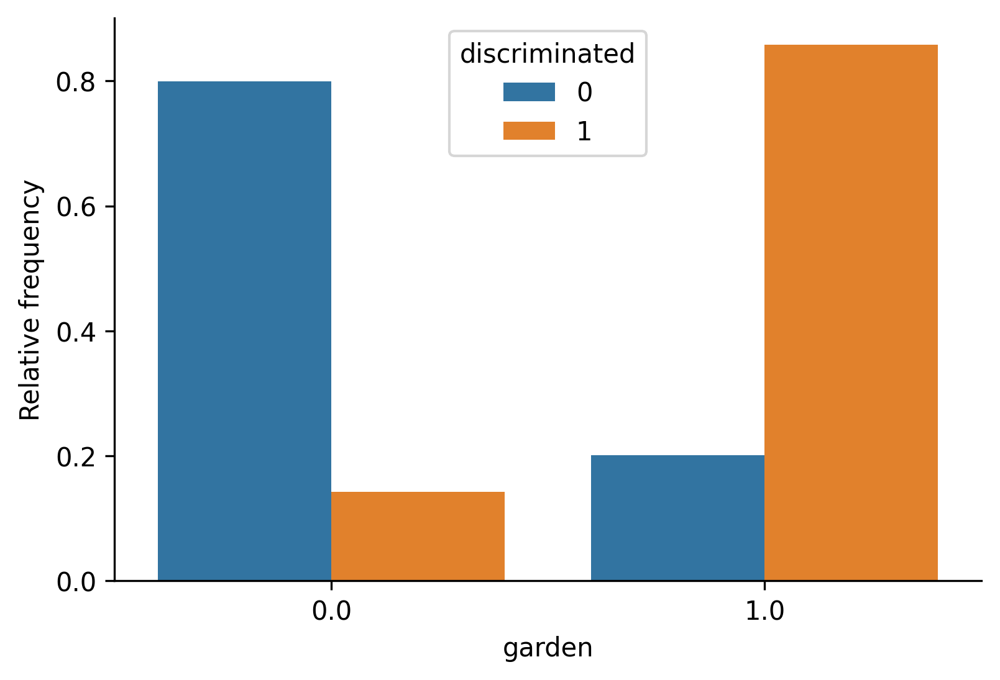

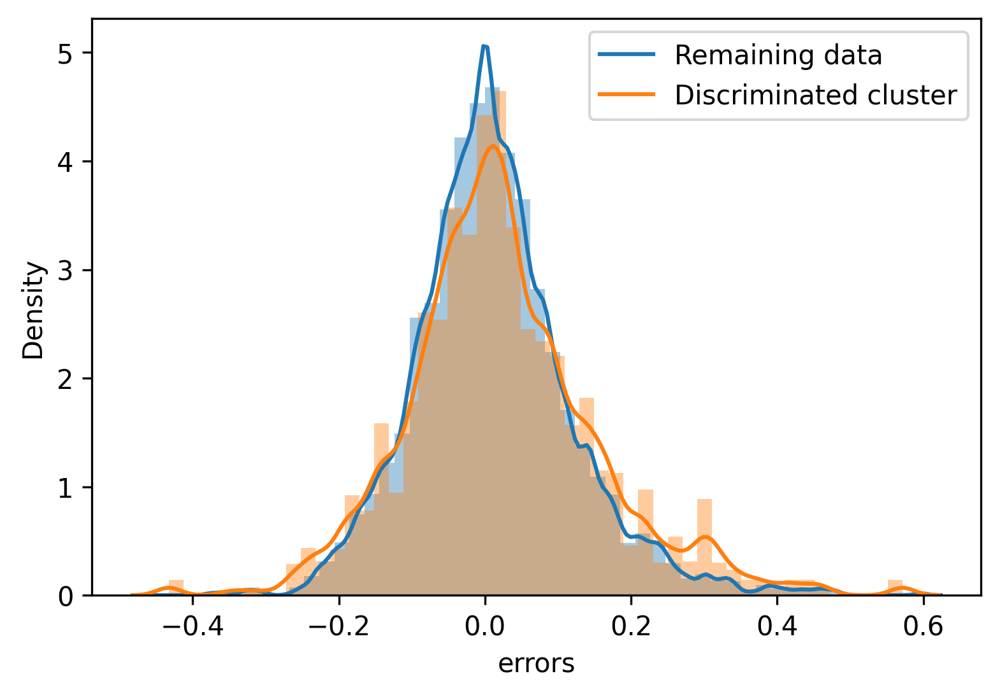

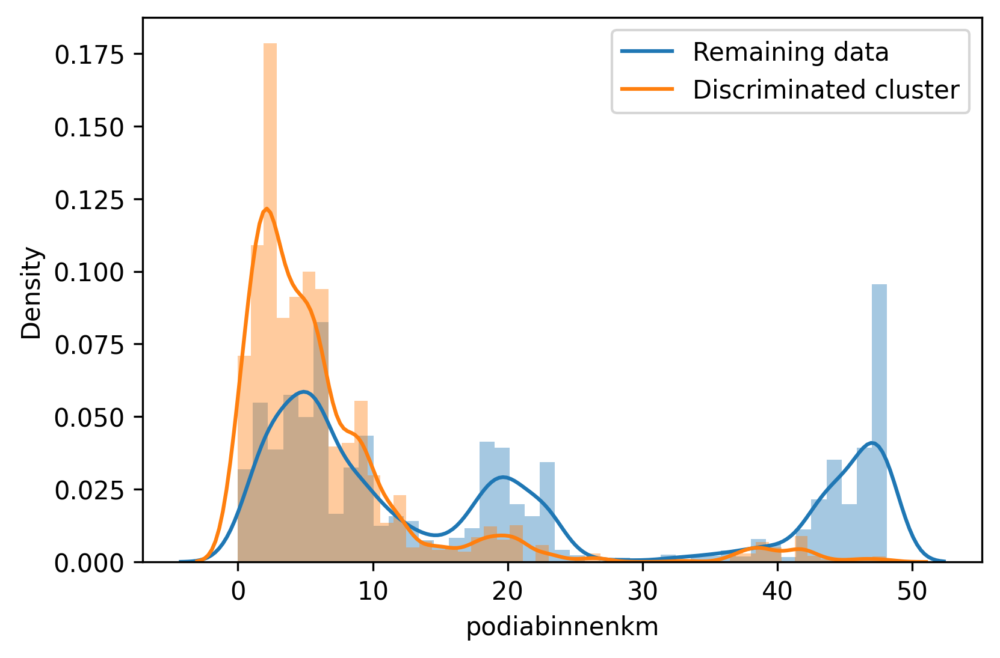

...

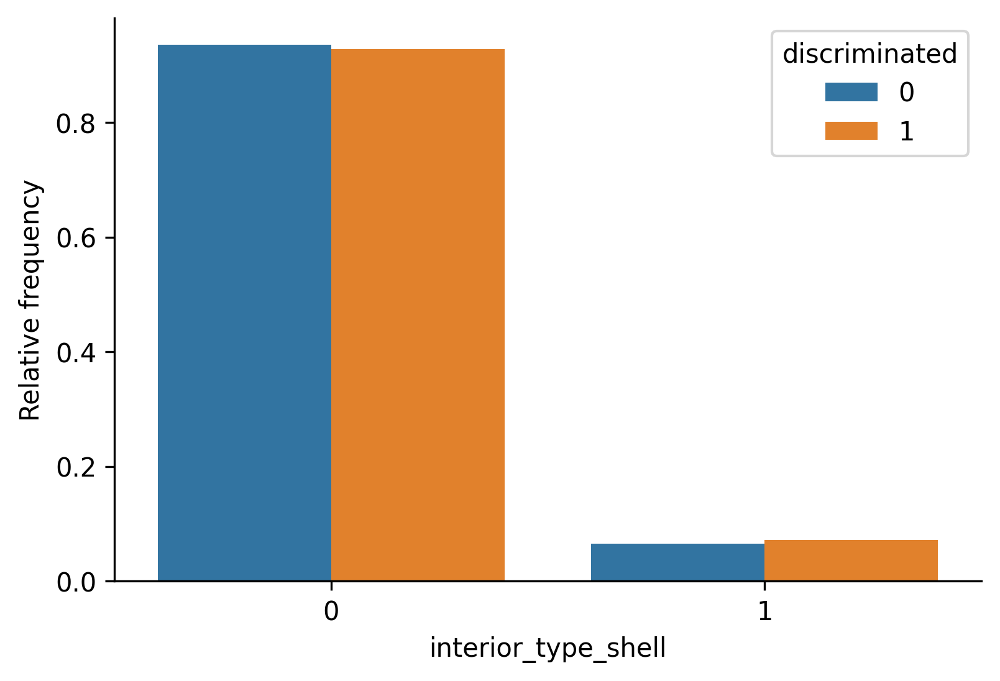

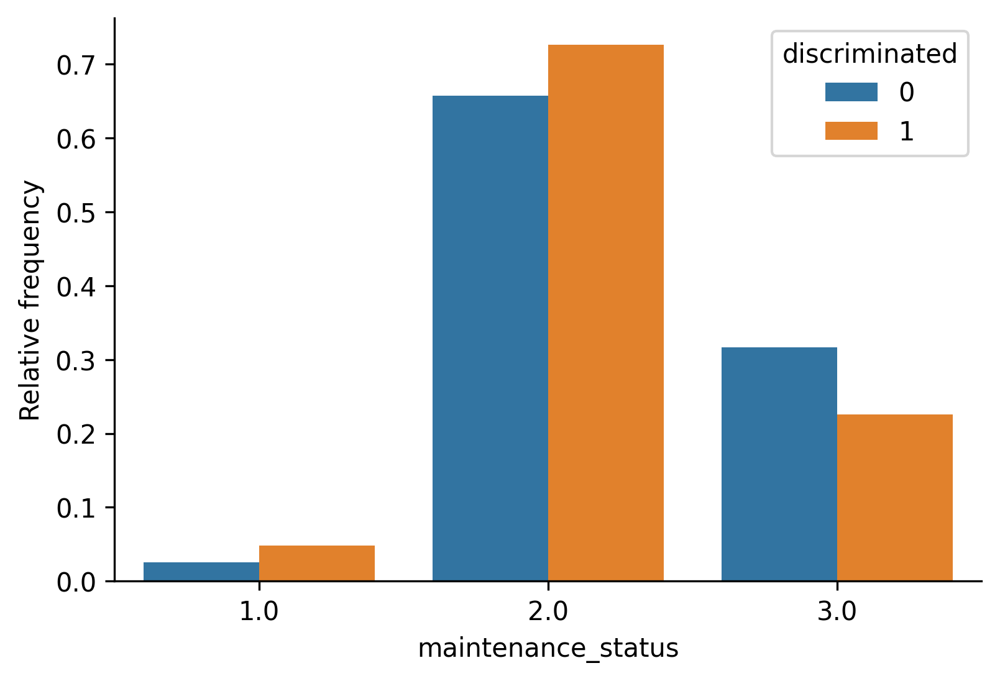

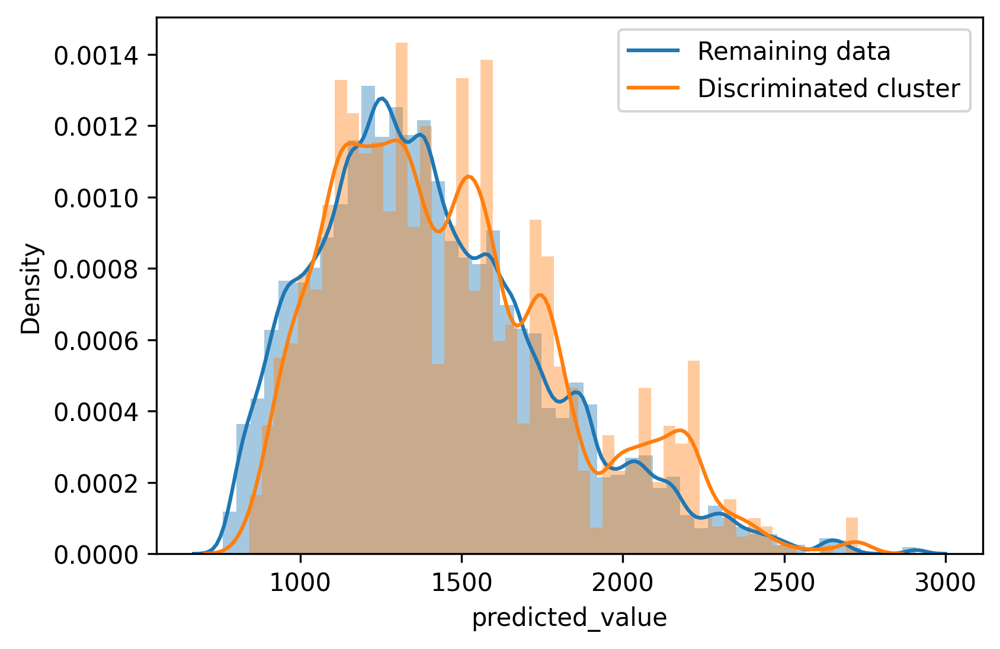

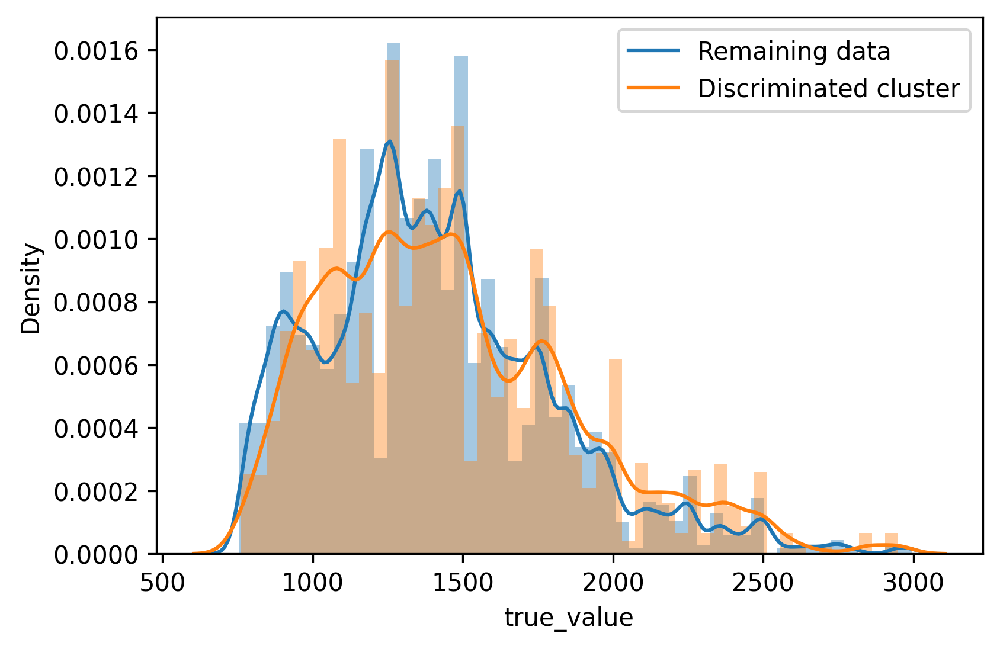

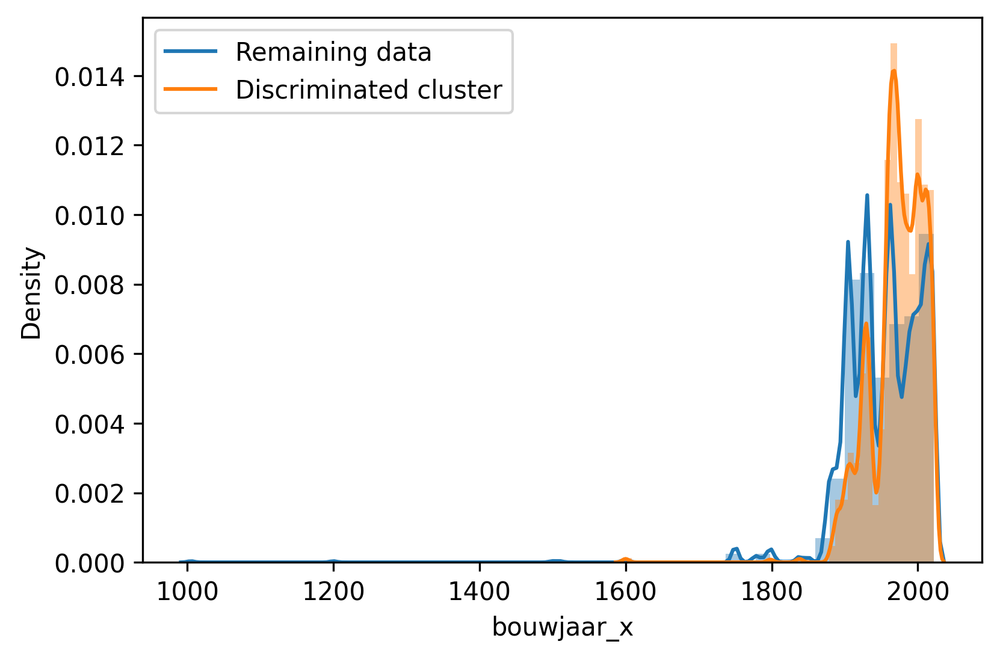

Averages results of 100 runs of HBAC
Average maximun negative biased cluster:  -0.09415956884008395 ± 0.019404406999466373 , min= -0.10971547332258258
Average number of clusters:  3.35 ± 0.8986100377805714
Average Sillhouette score:  0.22073922299593 ± 0.037427099897762946 , max= 0.2793632314771801


In [149]:
# Number of times to run HBAC.
num_runs = 100

avg_bias = []
avg_sillh = []
avg_number_of_clusters = []
for run_i in range(1, num_runs+1):
    results = hbac_kmeans.hbac_kmeans(df, 0.8, show_plot=False)
    c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
    avg_bias.append(max_neg_bias)
    avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                          results['clusters']))
    avg_number_of_clusters.append(len(results['clusters'].unique()) )
    discriminated_cluster = results[results['clusters']==c]
    unscaled_discriminated = df.loc[discriminated_cluster.index, :]
    unscaled_remaining = df.drop(discriminated_cluster.index)
    if run_i == 1:
        all_unscaled_discriminated = unscaled_discriminated.copy()
        all_unscaled_remaining = unscaled_remaining.copy()
    else:
        all_unscaled_discriminated = pd.concat([all_unscaled_discriminated, unscaled_discriminated])
        all_unscaled_remaining = pd.concat([all_unscaled_remaining, unscaled_remaining])
        
significant_features = []
welch_T = []
p_values = []

# Welch's test for differences discrimninated vs remaining data
significant_features = []
welch_T = []
p_values = []
for i in all_unscaled_remaining:
    welch_i = stats.ttest_ind(all_unscaled_discriminated[i], all_unscaled_remaining[i], equal_var=False)
    welch_T.append(welch_i.statistic)
    p_values.append(welch_i.pvalue)
    if welch_i.pvalue <= 0.05:
        significant_features.append(i)
mean_clusters = pd.DataFrame()
mean_clusters['unscaled_discriminated_mean'] = all_unscaled_discriminated.mean()
mean_clusters['unscaled_remaining_mean'] = all_unscaled_remaining.mean()
mean_clusters['difference'] = mean_clusters['unscaled_discriminated_mean'] - mean_clusters['unscaled_remaining_mean']
mean_clusters['abs_relative_difference'] = abs(mean_clusters['difference'])
mean_clusters['abs_relative_difference'] = mean_clusters['abs_relative_difference']/mean_clusters['unscaled_remaining_mean']
mean_clusters['welch_statistic'] = welch_T
mean_clusters['p_value'] = p_values
# SORT ON: absolute relative mean difference between means
mean_clusters = mean_clusters.sort_values(by='abs_relative_difference',ascending=False)
df_marked = mean_clusters.style.apply(lambda x: ['background: lightgreen' 
                                  if (x.name in significant_features)
                                  else '' for i in x], axis=1)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(mean_clusters)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_marked)
# creating df for parallel coordinate plot
df_parallel = mean_clusters.copy()
df_parallel['relative_difference'] = df_parallel['difference'] / df_parallel['unscaled_remaining_mean']
df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','abs_relative_difference','difference',
                  'welch_statistic','p_value'],axis=1,inplace=True)
df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(df_parallel_transpose.head())
# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=10)
    plt.legend(loc="upper left")
    plt.xlabel("Features")
    plt.ylabel("Absolute relative difference")
    plt.grid(linewidth=0.1)
    plt.title(title)
    plt.show()
create_parallel_coord_plot(df_parallel_transpose, "Absolute relative difference between discriminated and remaining data of all features")

##### Plot distribution discriminated cluster vs remaining data
unscaled_remaining = all_unscaled_remaining.copy()
unscaled_discriminated = all_unscaled_discriminated.copy()
unscaled_discriminated['discriminated'] = 1
unscaled_remaining['discriminated'] = 0
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])
features_sorted = list(mean_clusters.T.columns)
features_sorted.extend(['discriminated'])
unscaled_combined = unscaled_combined[features_sorted]
pd.to_pickle(unscaled_combined, "all_unscaled_combined.pkl")
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])
for col in mean_clusters.T.columns:
    if len(unscaled_remaining[col].unique()) > 15:
        fig, ax = plt.subplots()
        for a in [unscaled_remaining[col], unscaled_discriminated[col]]:
            sns.distplot(a, ax=ax)
            plt.legend(labels=["Remaining data","Discriminated cluster"])
        plt.show()
    # Quick fix to enter categorical
    if len(unscaled_remaining[col].unique())<= 15 and col !='discriminated':
#######         For percentage of Discriminated data per category
#         fig, ax = plt.subplots()
#         sns.barplot(x=col,y='Discriminated',  data=unscaled_combined, ax=ax,color='#3b75af')
#         sns.despine(fig)
#         plt.show()
####### Difference in relative count, #Used plot https://stackoverflow.com/questions/57024583/countplot-with-relative-frequencies-or-density-curves
        fig, ax = plt.subplots()
        relative_count = (unscaled_combined.groupby(['discriminated',col]).size() / 
                          unscaled_combined.groupby(['discriminated']).size()).reset_index().rename({0:'Relative frequency'}, axis=1)
        sns.barplot(x=col, hue='discriminated', y='Relative frequency', data=relative_count, ax=ax)
        sns.despine(fig)
        plt.show()

print('Averages results of {} runs of HBAC'.format(num_runs))
print('Average maximun negative biased cluster: ', mean(avg_bias), '±', np.std(avg_bias), ', min=', min(avg_bias))
print('Average number of clusters: ', mean(avg_number_of_clusters), '±',np.std(avg_number_of_clusters))
print('Average Sillhouette score: ', mean(avg_sillh),'±', np.std(avg_sillh),', max=', max(avg_sillh))

In [172]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(mean_clusters.round(decimals=3))
# with pd.option_context('display.precision', 2):
#     df_marked = mean_clusters.style.apply(lambda x: ['background: lightgreen' 
#                                                      if (x.unique_values < 15)
#                                                       else '' for i in x], axis=1)
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(df_marked)

,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.893,0.096,0.797,8.259,438.339,0.0
garden,0.858,0.201,0.657,3.278,313.131,0.0
errors,0.024,0.012,0.012,1.012,15.510,0.0
podiabinnenkm,6.636,19.740,-13.104,0.664,-234.651,0.0
total_bedrooms,3.551,2.147,1.404,0.654,355.716,0.0
bioscopenbinnenkm,2.961,7.162,-4.201,0.587,-221.122,0.0
listing_size_m2,113.855,73.803,40.051,0.543,306.508,0.0
total_rooms,4.781,3.212,1.569,0.488,359.672,0.0
interior_type_furnished,0.241,0.319,-0.078,0.244,-30.475,0.0
gemiddeldewoningwaarde,262.128,297.404,-35.276,0.119,-56.094,0.0


# Doing HBAC ONCE

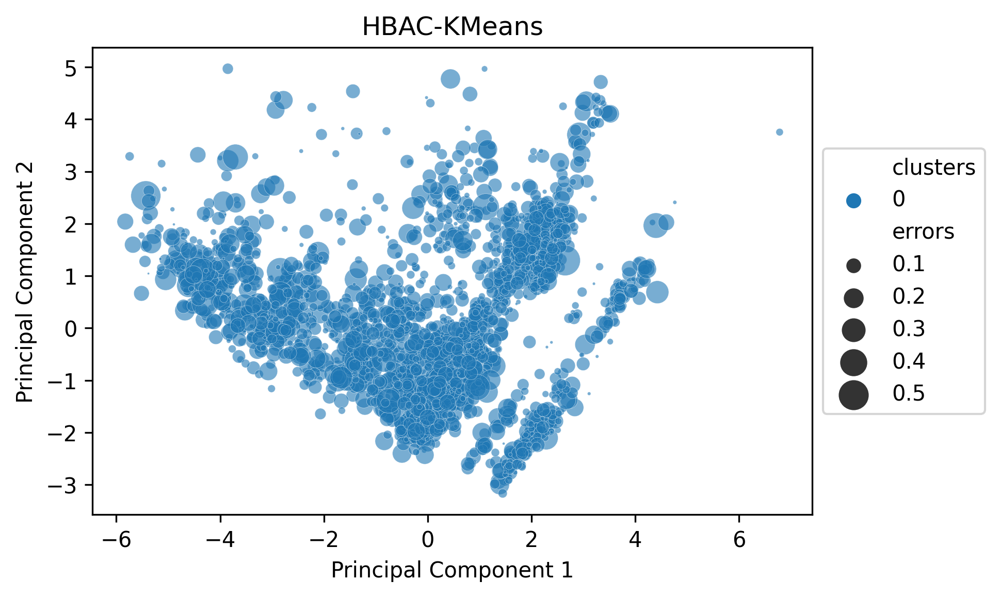

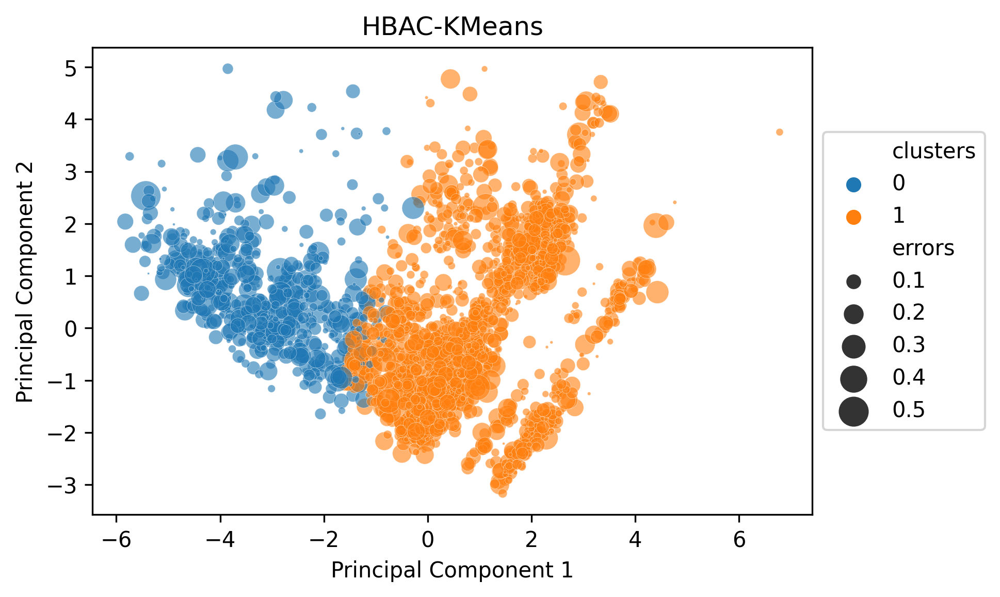

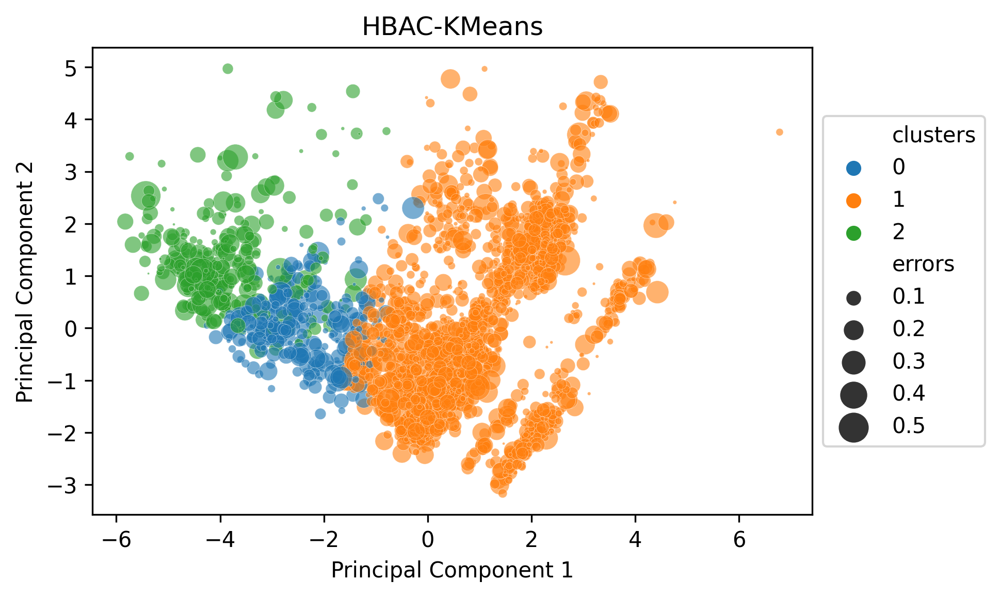

In [73]:
### TODO Effect of clustering on abs error instead???

df['errors'] = abs(df['errors'])

results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor = 0.8 , show_plot=True)

In [20]:
## Adding abs error to df
# df['abs_error'] = abs(results['errors'])

In [74]:
## Get biases per cluster 
c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results, printing=True)
print('Cluster ', c,'Bias ', max_neg_bias,'\n')
r2_full_data = hbac_kmeans.accuracy(results)
highest_biased_cluster = results[results['clusters']==c]
remaining_data = results[results['clusters']!=c]
r2_highest_biased_cluster = hbac_kmeans.accuracy(highest_biased_cluster)
r2_remaining_data = hbac_kmeans.accuracy(remaining_data)
print('R2 this dataset:', r2_full_data)
print('R2 of discriminated cluster:', r2_highest_biased_cluster)
print('R2 of remaining clusters:', r2_remaining_data)
discriminated_cluster = results[results['clusters']==c]
print('Number of instances in discriminated cluster:', len(discriminated_cluster))
silh = metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                              results['clusters'])
print('\n', 'Silhouete score: ', silh)
# print('Dataframe of found discriminated cluster:')
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#display(discriminated_cluster)

1 has bias 0.07072056648691027
2 has bias -0.06312913565948997
0 has bias -0.10279924334383861
cluster with the highest discriminating bias: 0
Cluster  0 Bias  -0.10279924334383861 

R2 this dataset: 0.8437148874263389
R2 of discriminated cluster: 0.747760122507745
R2 of remaining clusters: 0.8505593658515836
Number of instances in discriminated cluster: 316

 Silhouete score:  0.19817722322363618


In [22]:
# unscaling the clusters
unscaled_discriminated = df.loc[discriminated_cluster.index, :]
# unscaled other data
unscaled_remaining = df.drop(discriminated_cluster.index)

# Welch's test for differences discrimninated vs remaining data
significant_features = []
welch_T = []
p_values = []
for i in unscaled_remaining:
    welch_i = stats.ttest_ind(unscaled_discriminated[i], unscaled_remaining[i], equal_var=False)
    welch_T.append(welch_i.statistic)
    p_values.append(welch_i.pvalue)
    if welch_i.pvalue <= 0.05:
        significant_features.append(i)
print('Number of significant difference in features of discriminated vs remaining data: ', len(significant_features))

Number of significant difference in features of discriminated vs remaining data:  14


In [23]:
mean_clusters = pd.DataFrame()
mean_clusters['unscaled_discriminated_mean'] = unscaled_discriminated.mean()
mean_clusters['unscaled_remaining_mean'] = unscaled_remaining.mean()
mean_clusters['difference'] = unscaled_discriminated.mean() - unscaled_remaining.mean()
mean_clusters['abs_relative_difference'] = abs(mean_clusters['difference'])
mean_clusters['abs_relative_difference'] = mean_clusters['abs_relative_difference']/mean_clusters['unscaled_remaining_mean']
mean_clusters['welch_statistic'] = welch_T
mean_clusters['p_value'] = p_values

# SORT ON: absolute relative mean difference between means
mean_clusters = mean_clusters.sort_values(by='abs_relative_difference',ascending=False)
df_marked = mean_clusters.style.apply(lambda x: ['background: lightgreen' 
                                  if (x.name in significant_features)
                                  else '' for i in x], axis=1)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_marked)

,unscaled_discriminated_mean,unscaled_remaining_mean,difference,abs_relative_difference,welch_statistic,p_value
listing_residential_type_house,0.818471,0.108255,0.710216,6.560555,31.378508,0.000000
garden,0.799363,0.214174,0.585189,2.732299,24.341349,0.000000
interior_type_shell,0.159236,0.054128,0.105108,1.941850,4.967684,0.000001
podiabinnenkm,5.574841,20.214681,-14.639840,0.724218,-30.382101,0.000000
bioscopenbinnenkm,2.826115,7.292212,-4.466097,0.612448,-25.561898,0.000000
interior_type_furnished,0.194268,0.324377,-0.130109,0.401106,-5.377236,0.000000
listing_size_m2,98.898089,75.768302,23.129787,0.305270,20.531142,0.000000
total_bedrooms,2.875796,2.234424,0.641373,0.287042,23.078818,0.000000
total_rooms,4.006369,3.312305,0.694064,0.209541,21.975628,0.000000
gemiddeldewoningwaarde,236.656051,299.003115,-62.347064,0.208516,-9.655206,0.000000


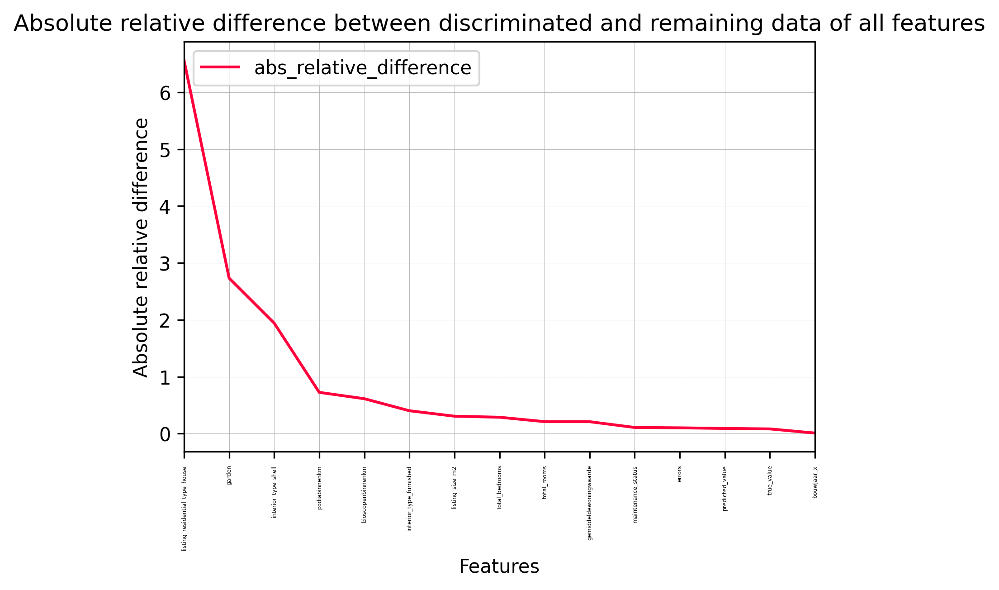

In [24]:
# creating df for parallel coordinate plot
df_parallel = mean_clusters.copy()
df_parallel.drop(['unscaled_discriminated_mean','unscaled_remaining_mean','difference','welch_statistic','p_value'],axis=1,inplace=True)

df_parallel_transpose = df_parallel.T
df_parallel_transpose['index'] = df_parallel_transpose.index
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     display(df_parallel_transpose.head())

# create parallel coordinate plot
def create_parallel_coord_plot(copy_research_transpose, title):
    disc_plot = parallel_coordinates(copy_research_transpose, 'index',color=('#ff003c'),axvlines=False)
    plt.xticks(rotation=90,fontsize=3)
    plt.legend(loc="upper left")
    plt.xlabel("Features")
    plt.ylabel("Absolute relative difference")
    plt.grid(linewidth=0.2)
    plt.title(title)
    plt.show()

create_parallel_coord_plot(df_parallel_transpose, "Absolute relative difference between discriminated and remaining data of all features")

In [25]:
## Save unscaled df and also sort unscaled df based on differences

unscaled_discriminated['discriminated'] = 1
unscaled_remaining['discriminated'] = 0
unscaled_combined = pd.concat([unscaled_discriminated,unscaled_remaining])
features_sorted = list(mean_clusters.T.columns)
features_sorted.extend(['discriminated'])
unscaled_combined = unscaled_combined[features_sorted]

pd.to_pickle(unscaled_combined, "unscaled_combined.pkl")
unscaled_combined

,listing_residential_type_house,garden,interior_type_shell,podiabinnenkm,bioscopenbinnenkm,interior_type_furnished,listing_size_m2,total_bedrooms,total_rooms,gemiddeldewoningwaarde,maintenance_status,errors,predicted_value,true_value,bouwjaar_x,discriminated
7665,0,0.0,0,2.0,0.0,0,134.0,3.0,4.0,181.0,2.0,0.048662,1337.043823,1275.0,2001.0,1
4331,1,0.0,0,7.0,2.0,0,119.0,3.0,4.0,197.0,1.0,0.080485,1399.227795,1295.0,1985.0,1
1146,1,0.0,1,6.8,3.0,0,117.0,3.0,4.0,200.0,2.0,0.279073,1341.747403,1049.0,2015.0,1
6120,1,1.0,0,6.0,4.0,0,105.0,3.0,4.0,145.0,2.0,0.111238,1239.823176,1395.0,2008.0,1
213,1,1.0,0,6.7,4.0,0,113.0,3.0,4.0,460.0,2.0,0.020057,1396.418513,1425.0,2015.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5612,0,1.0,0,6.0,1.0,0,65.0,2.0,3.0,249.0,3.0,0.126591,1441.124550,1650.0,1993.0,0
13224,0,0.0,0,4.3,2.0,0,90.0,3.0,4.0,270.0,2.0,0.083861,1145.174058,1250.0,1920.0,0
9262,0,1.0,0,3.0,0.0,0,79.0,2.0,3.0,234.0,3.0,0.049808,1049.807682,1000.0,2005.0,0
13264,0,0.0,0,4.0,1.0,0,87.0,2.0,3.0,320.0,2.0,0.038027,1032.836376,995.0,2019.0,0


In [26]:
# for col in unscaled_combined.columns:
#     print(col)
#     print(unscaled_combined[col].dtypes())

# unscaled_combined.dtypes()

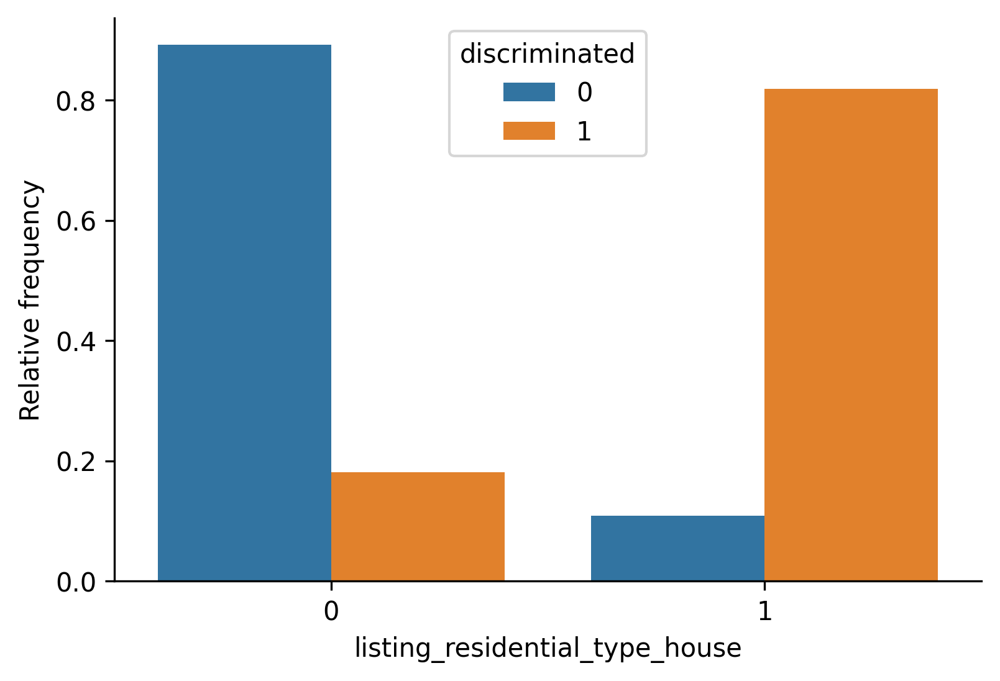

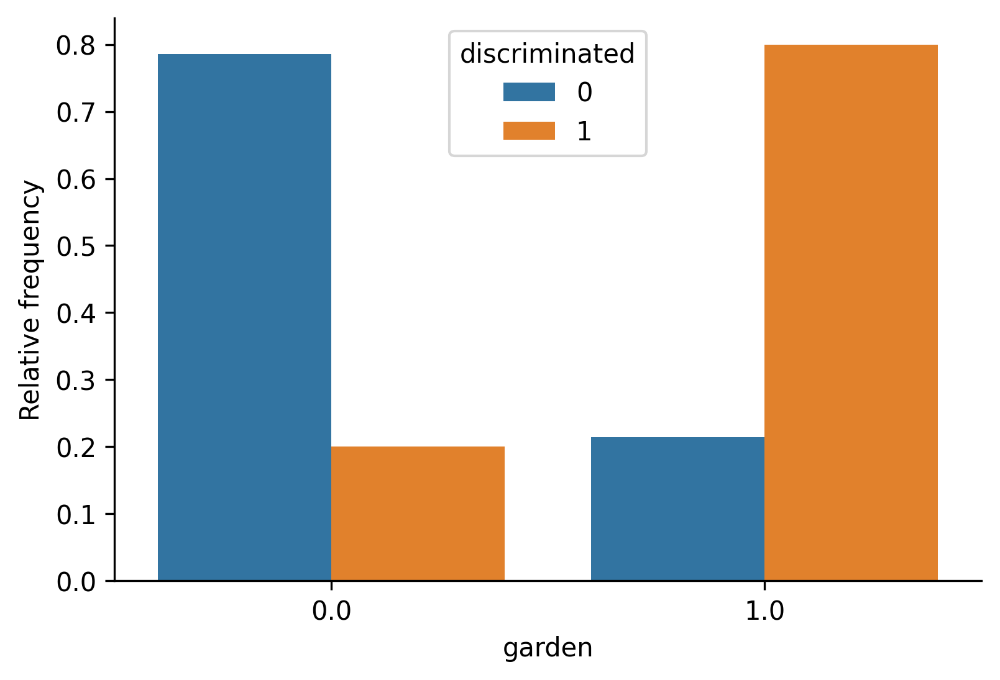

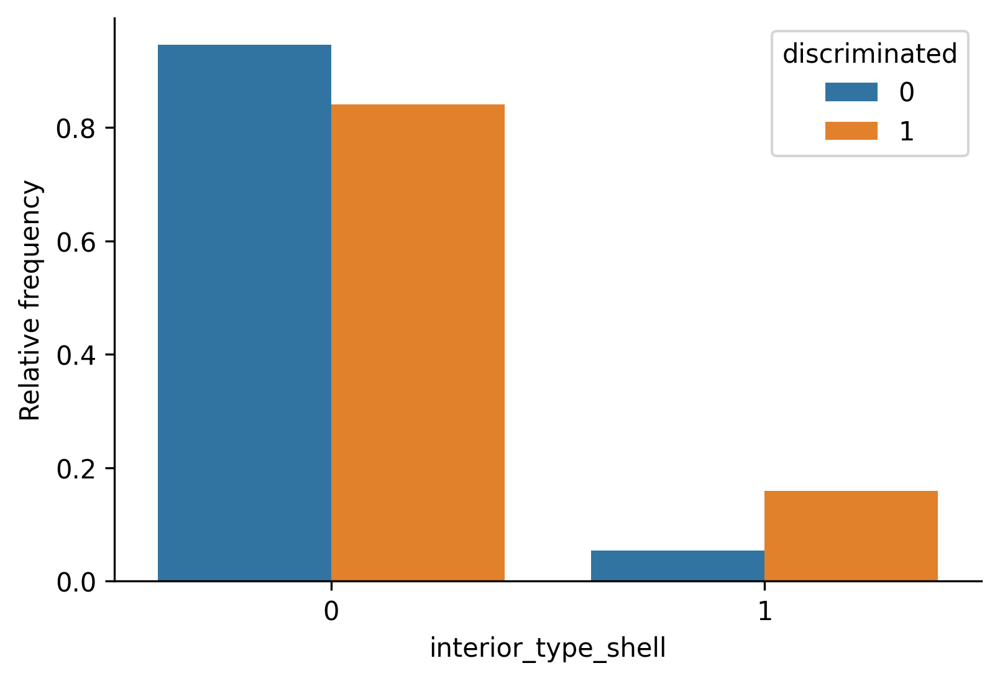

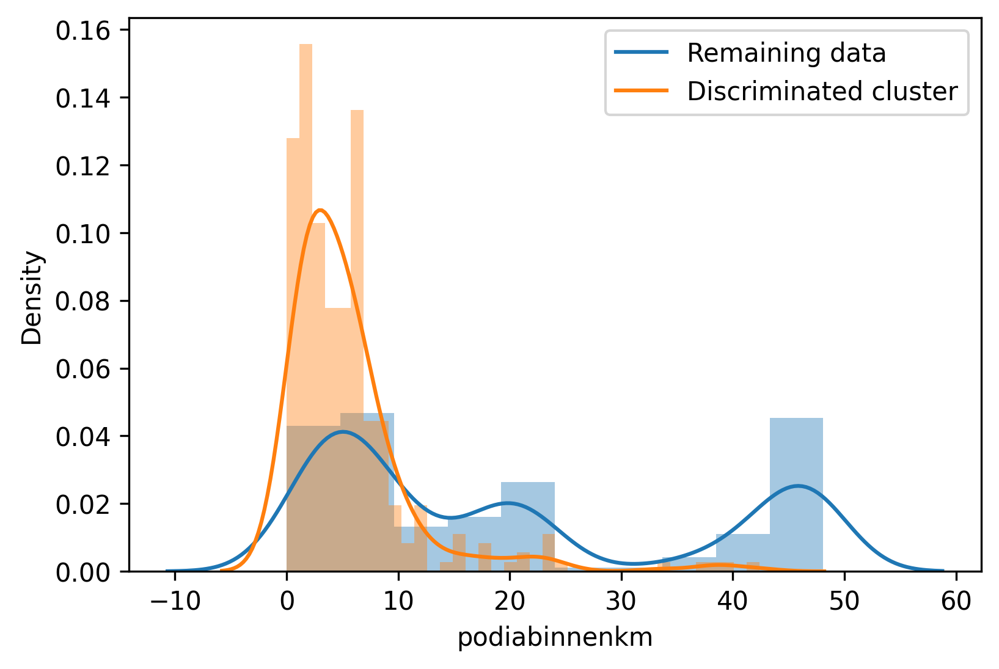

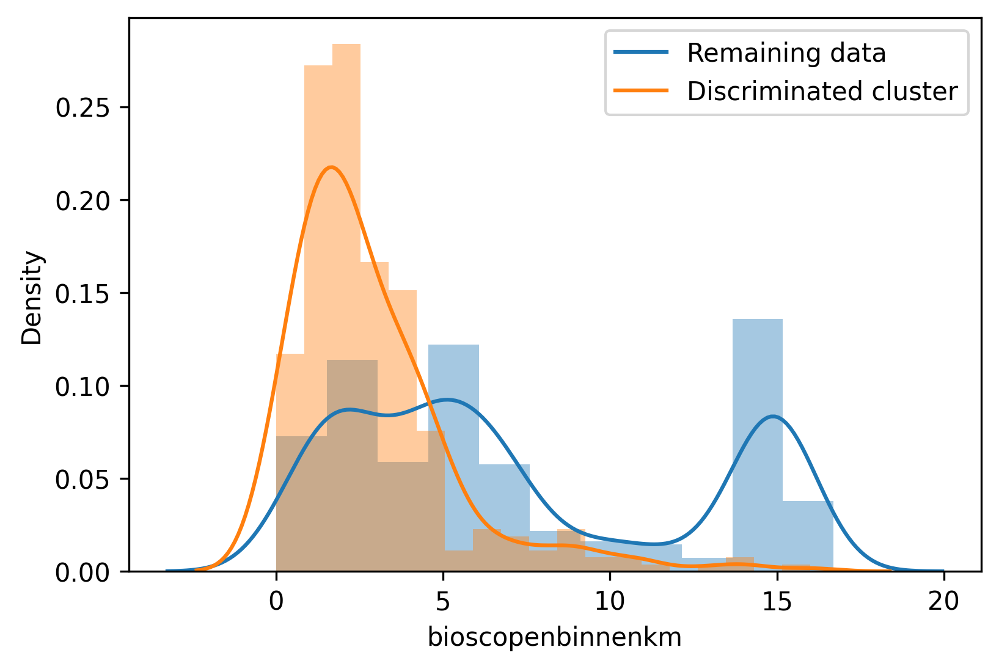

...

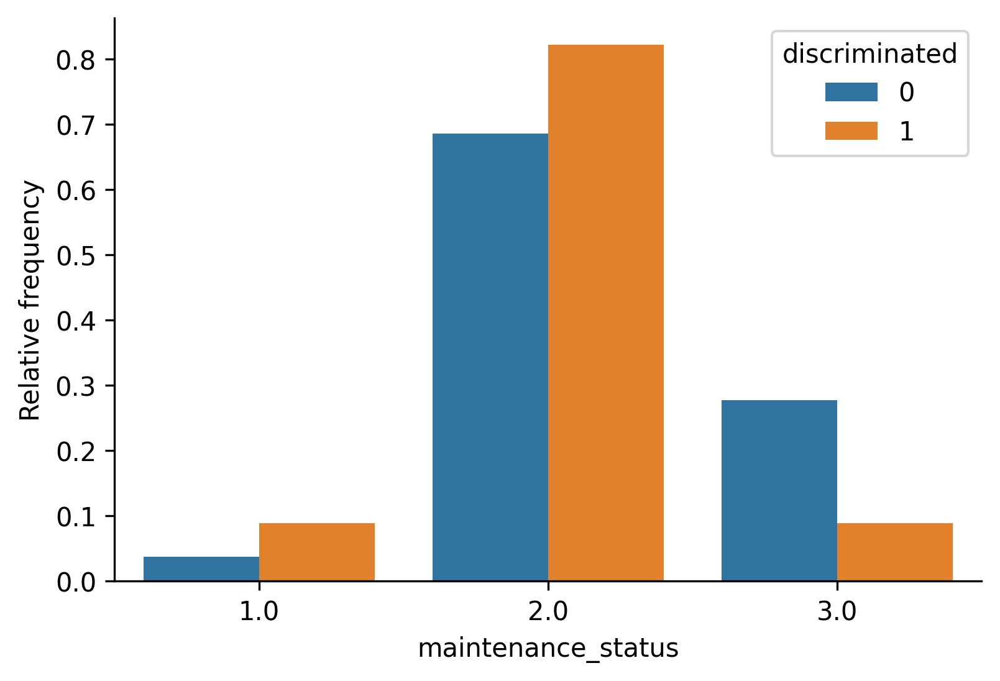

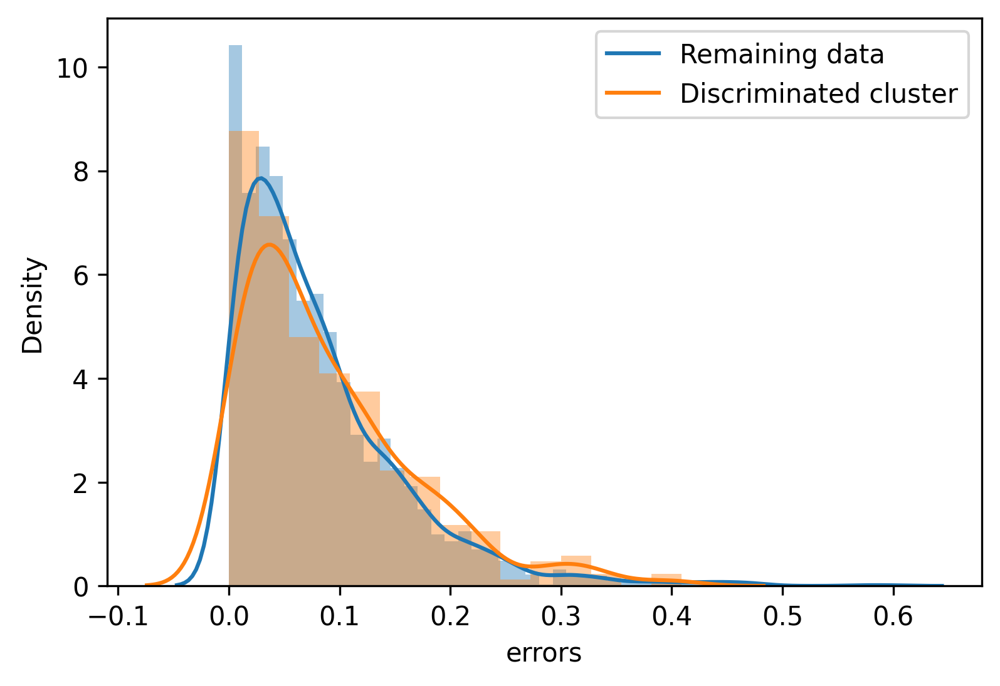

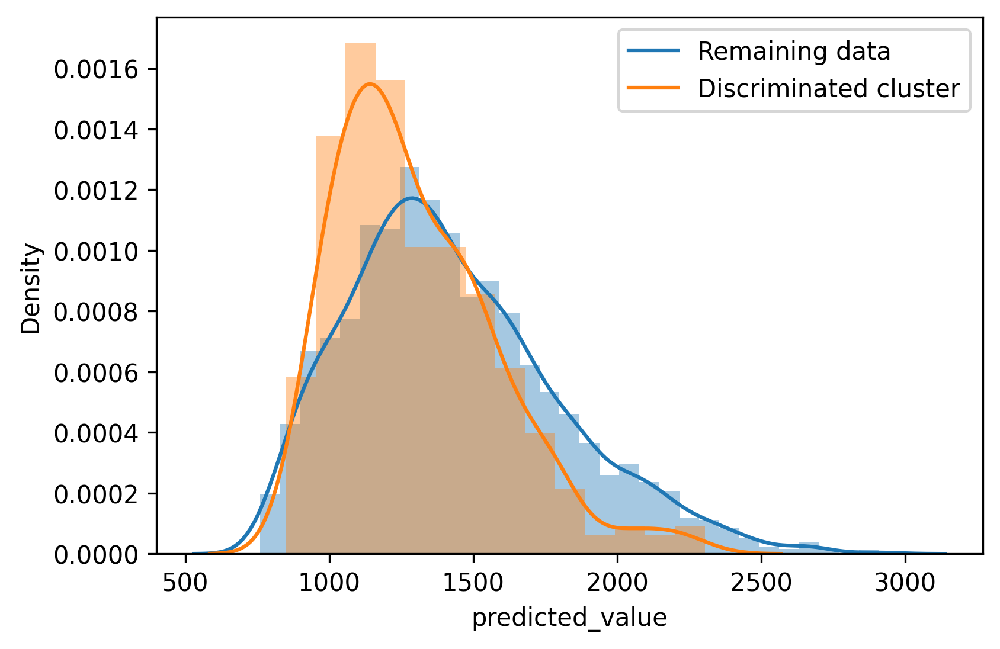

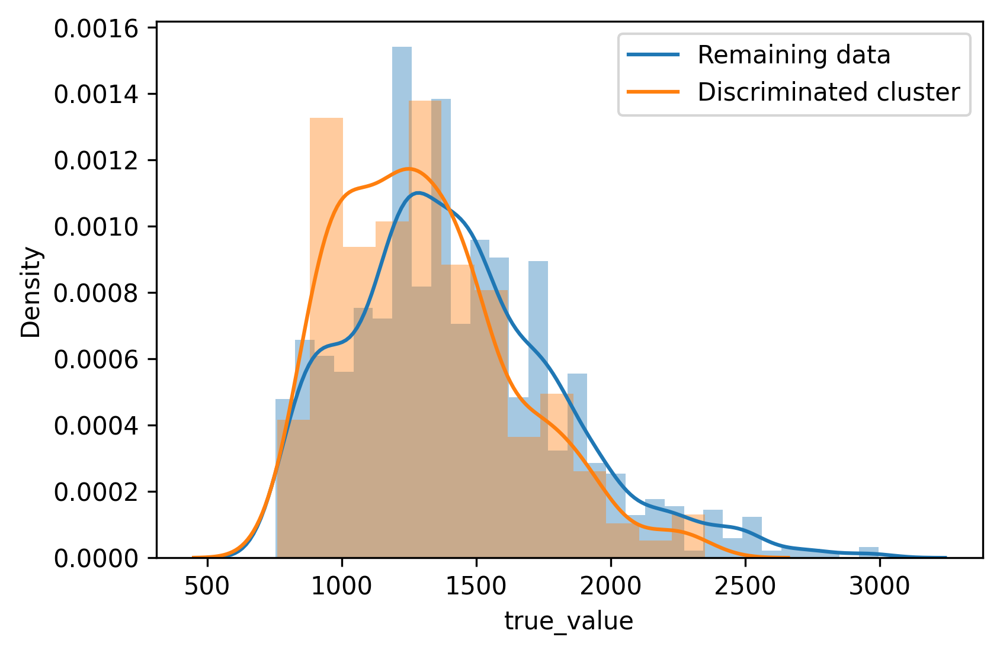

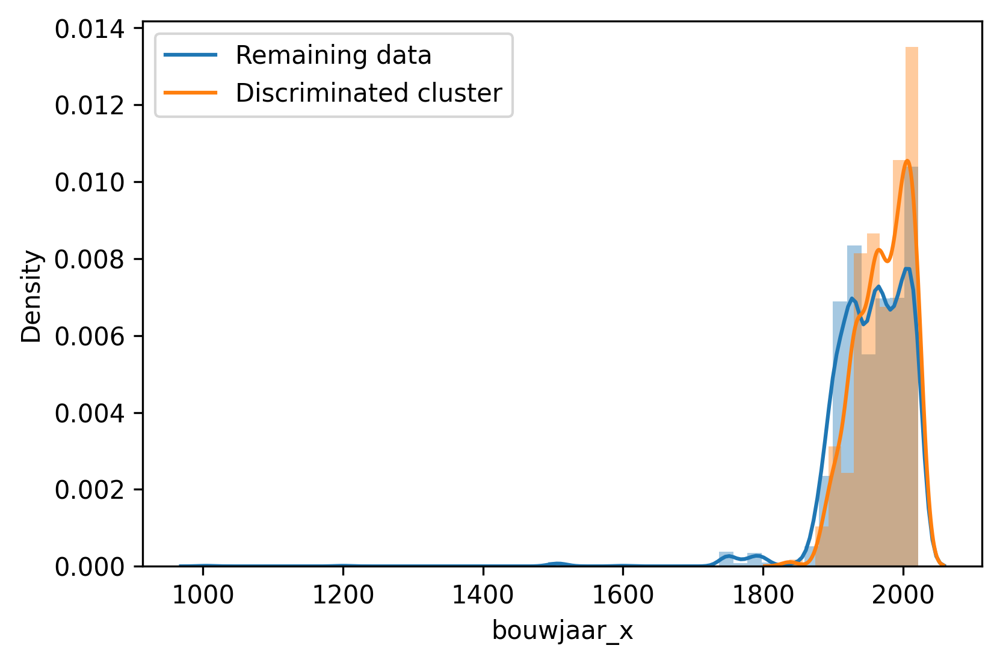

In [27]:
##### Plot distribution discriminated cluster vs remaining data



for col in mean_clusters.T.columns:
    if len(unscaled_remaining[col].unique()) > 15:
        fig, ax = plt.subplots()
        for a in [unscaled_remaining[col], unscaled_discriminated[col]]:
            sns.distplot(a, ax=ax)
            plt.legend(labels=["Remaining data","Discriminated cluster"])
        plt.show()
    
    # Quick fix to enter categorical
    if len(unscaled_remaining[col].unique())<= 15 and col !='discriminated':
    
#######         For percentage of Discriminated data per category
#         fig, ax = plt.subplots()
#         sns.barplot(x=col,y='Discriminated',  data=unscaled_combined, ax=ax,color='#3b75af')
#         sns.despine(fig)
#         plt.show()

####### Difference in relative count, #Used plot https://stackoverflow.com/questions/57024583/countplot-with-relative-frequencies-or-density-curves
        fig, ax = plt.subplots()
        relative_count = (unscaled_combined.groupby(['discriminated',col]).size() / 
                          unscaled_combined.groupby(['discriminated']).size()).reset_index().rename({0:'Relative frequency'}, axis=1)
        sns.barplot(x=col, hue='discriminated', y='Relative frequency', data=relative_count, ax=ax)
        sns.despine(fig)
#         plt.legend()
        plt.show()

        


In [160]:
# Mean datapoint of discriminated cluster

# mean_dp = mean_clusters.drop(['predicted_value','true_value','errors'])
# mean_dp['discriminated_median'] = unscaled_discriminated.median()
# mean_dp['remaining_median'] = unscaled_remaining.median()
# mean_dp = mean_dp.rename({'unscaled_discriminated_mean': 'unscaled_discriminated_mean_rounded', 'unscaled_remaining_mean': 'unscaled_remaining_mean_rounded'}, axis='columns')
# mean_dp = mean_dp.drop(['difference','abs_relative_difference','welch_statistic','p_value'],axis=1).round()
# display(mean_dp)
# display(mean_dp[['unscaled_discriminated_mean_rounded']].T)

# Error scaling optimization

In [14]:
#### Error scaling factor optimization

from statistics import mean

biases = []
std = []
sillh_list = []
std_sillh = []
# DB_list = []
# CH_list = []
scaling_factors = np.arange(0,10,0.5)

for error_scaling_factor in scaling_factors:
    avg_bias = []
    avg_sillh = []
    for i in range(10):
        results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor, show_plot=False)
        c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
        avg_bias.append(max_neg_bias)
        
        avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                              results['clusters']))
        
#         DB_score = metrics.davies_bouldin_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
#         CH_index = metrics.calinski_harabasz_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
        
    biases.append(mean(avg_bias))
    std.append(np.std(avg_bias))
    sillh_list.append(mean(avg_sillh))
    std_sillh.append(np.std(avg_sillh))


r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.0931491163879099
--> Cluster with the highest 

max discriminating bias is: -0.052745598248193803
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038686983680467444, 0.0038

max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.05252500555010342
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.0524301477597785
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we hav

max discriminating bias is: -0.05271219709086883
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminating bias is: -0.11609629018086354
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09723345013395901
This is the random cluster we have picked: 2
max discriminat

max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random clus

max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.052559

max discriminating bias is: -0.0621988614690554
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 1
max discriminating bias is: -0.08498484051774424
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.10386670604278214
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 2
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 1
max discriminating bias is: -0.10386670604278214
This is the random cluster we have picked: 1
max discriminating bias is: -0.117455

max discriminating bias is: -0.052559311238858375
This is the random cluster we have picked: 4
MAX_ITER
Variance list  [0.0038686983680467444, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.004461093220940442, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226, 0.00480847792804226]
1 has bias 0.0621988614690554
0 has bias -0.11540903101370048
2 has bias -0.08498484051774424
3 has bias -0.006240398081801768
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06418453981807448
-->

max discriminating bias is: -0.10646897719281223
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 2
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870874917
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -0.36493219109583963
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.28400375870

max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 1
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 0
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random 

max discriminating bias is: -0.06421573472316433
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 2
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.2410587519711045
This is the random cluster we have picked: 0
max discriminating bias is: -0.050462458303612845
This is the random cluster we have picked: 1
max discriminating bias is: -0.241058

This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 1
max discriminating bias is: -0.10008821206520879
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.004618946213056237, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271, 0.02143188998829271]
0 has bias 0.06796282964279987
1 has bias -0.03333758804152531
2 has bias -0.2805920182704137
cluster with the highest discriminating bias: 2
r_squared of

max discriminating bias is: -0.04593000039065198
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 0
max discriminating bias is: -0.09956930886379844
This is the random cluster we have picked: 0
max discriminating bias is: -0.09956930886379844
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 1
max discriminating bias is: -0.04593000039065198
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 2
max discriminating bias is: -0.3312507861942553
This is the random cl

max discriminating bias is: -0.06596973969455566
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -0.2804983366737288
--> Cluster with the highest variance: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09269732930455632
This is the random cluster we have picked: 1
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.04790764262180092
This is the random cluster we have picked: 0
max discriminating bias is: -0.047

max discriminating bias is: -0.3312507861942553
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.004352006555367433, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449, 0.02008215800815449]
1 has bias 0.06596973969455566
2 has bias -0.03420168158295889
0 has bias -0.27194226544511624
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06596973969455566
--> Cluster with the highest variance: 0
--> Cluster wi

This is the random cluster we have picked: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 4
This is the random cluster we have picked: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.004446184523765125, 0.019865339636917747, 0.019865339636917747, 0.019865339636917747, 0.

max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 1
max discriminating bias is: -0.5419046471773081
--> Cluster with the highest variance: 0
max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 1
max discriminating bias is: 0.11705420055253724
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.11694775537987856
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.36753497752757835
This is the random clust

max discriminating bias is: -0.048448207019119005
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.004446184523765125, 0.019865339636917747, 0.019865339636917747, 0.019865339636917747, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893, 0.07020990530933893]
1 has bias 0.06667971598443656
3 has bias 0.1416285476192407
2 has bias -0.2694436902996188
0 has bias -0.5170080971408249
cluster with the highest discriminating bias: 0
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.06667971598443656
--> Cluster with the h

max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.11738096693527855
This is the random cluster we have picked: 0
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 0
max discriminating bias is: -0.36753497752757835
This is the random cluster we have picked: 2
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.1172751734797054
This is the random cluster we have picked: 1
max discriminating bias is: -0.04932407441464248
This is the random cluster we have picked: 3
max discriminating bias is: 0.11738096693527855
This is the random 

max discriminating bias is: -0.27644707051868034
This is the random cluster we have picked: 0
max discriminating bias is: -1.0560784093516735
This is the random cluster we have picked: 1
MAX_ITER
Variance list  [0.01714877477716305, 0.013419032776175925, 0.013419032776175925, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307, 0.21711513876365307]
2 has bias -0.01227742918021435
1 has bias 0.13095333053100655
0 has bias -0.0708245292752201
3 has bias -1.0466929022769063
cluster with the highest discriminating bias: 3
r_squared of all data is:

max discriminating bias is: -0.2888835313760587
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 4
This is the random cluster we have picked: 2
max discriminating bias is: -1.0574889378572339
This is the random cluster we have picked: 1
max discriminating bias is: -0.2888835313760587
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -1.6278722670618029
This is the random cluster we have picked: 0
max discriminating bias is: -0.0669536463591035
This is the random cluster we have picked: 4
This is the random cluster we have picked: 4
This is the random cluster we have picked: 3
max discriminating bias is: -1.6066689719365927
This is the random cluster we have picked: 2
max discriminating bias is: -1.0574889378572339
This is the random cluster w

max discriminating bias is: -0.06606756625805843
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -1.026689606520753
--> Cluster with the highest variance: 3
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -1.1952137595531234
This is the random cluster we have picked: 1
max discriminating bias is: -1.6148669846169155
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have picked: 3
max discriminating bias is: -0.28074259904441556
This is the random cluster we have picked: 1
max discriminating bias is: -1.7301132520316498
This is the random cluster we have pick

max discriminating bias is: -0.9892926268478618
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 1
max discriminating bias is: -0.1732410799265709
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 1
max discriminating bias is: -0.1105

max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 2
max discriminating bias is: -1.0252680546278343
This is the random cluster we have picked: 1
max discriminating bias is: 0.007830087135099473
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.01552477672429593, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.25273618155668903, 0.252736181

max discriminating bias is: -0.0994555342628094
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 0
max discriminating bias is: -0.10800738726024717
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0319152472094602
This is the random cluster we have picked: 0
max discriminating bias is: -0.10983977585190619
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is

max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1732410799265709
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 0
max discriminating bias is: 0.007319554470803902
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random cluster we have picked: 1
max discriminating bias is: -0.11056797942718766
This is the random cluster we have picked: 2
max discriminating bias is: -1.0395509059095944
This is the random clu

max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018103852024413454, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456, 0.292307879408456]
2 has bias 0.021736169745606437
1 has bias 0.13455055564513085
0 has bia

max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 1
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 1
max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 1
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is:

max discriminating bias is: -0.13455055564513085
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0350614010826935
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
max discriminating bias is: -0.1751981974695398
This is the random cluster we have picked: 2
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 2
max discriminating bias is: 0.007633417027105627
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked:

max discriminating bias is: 0.007361410916876809
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.1752771189265645
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018103852024413454, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.2776279354400707, 0.27762793544007

max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is:

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13695026862424242
--> Cluster with the highest variance: 1
max discriminating bias is: -1.089999209247868
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 2
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367

max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 1
max discriminating bias is: 0.008623143905345909
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018755376076252158, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.30586112638930574, 0.

max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23432379367296752
This is the random cluster we have picked: 1
max discriminating bias is: 0.008893581683858898
This is the random cluster 

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13695026862424242
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0879530456458477
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23457684227343745
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0
max discriminating bias is: -0.23569801282552727
Th

This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.009796490344219477
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018732495474513236, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164, 0.3049901334580164]
2 has bias 0.0217676296337711
1 has bias 0.136

max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 2
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 0
max discriminating bias is: 0.012561383074786825
This is the random cluster we have picked: 0
max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: 0.010059201269048135
This is the random cluster we have picked: 1
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 1
max discriminating bias is: -0.23569801282552727
This is the random cluster we have picked: 2
max discriminating bias is: -2.531948474368013
This is the random clu

max discriminating bias is: -0.13696679434325487
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0856016746329051
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.010320409569132605
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.5083522681816515
This is the random cluster we have picked: 2
max discriminating bias is: 0.009807373597386926
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: -0.23491036134

max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018736981639112065, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133, 0.3037084884197133]
2

max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 1
max discriminating bias is: 0.013898489176826345
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: 0.012729681888893896
This is the random cluster we have picked: 1
max discriminating bias is: 0.009814894104802518
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random c

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.1368830947893569
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0856016746329051
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.009814894104802518
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23712956832101129
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.469375774734395
This is the random cluster we have picked: 0

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 0
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018403755234608125, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027]
0 has bias 0.024011819819329427
1 has bias 0.13566044093474017
2 has bias -1.071367418135231
cluster with the highest discriminating bias: 2
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.1374742

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 1
max discriminating bias is: -0.23399246012578168
This is the random cluster we have picked: 2
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 2
max discriminating bias is: 0.016887943348035783
This is the random cluster we have picked: 3
This is the random cluster w

max discriminating bias is: -1.071367418135231
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: 0.013073863753917392
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 0
max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 2
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724

max discriminating bias is: -0.23361572221879878
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23399246012578168
This is the random cluster we have picked: 0
max discriminating bias is: 0.016926819225852485
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: 0.01582579080409441
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018403755234608125, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.2965819269011027, 0.

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cl

max discriminating bias is: -0.13502309530243062
--> Cluster with the highest variance: 0
max discriminating bias is: -1.071367418135231
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 2
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.08584769416883

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758, 0.2965195506450758]
1 has bias 0.024579728197989925
0 has bias 0.13502309530243062
2 has bias -1.071367418135231
cluster with the highest discriminating bia

max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.09260074320500744
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 1
max discriminating bias is: -0.23410929511346734
This is the random cluster we have picked: 0
max discriminating bias is: -0.08367508904414134
This is the random cluster we have picked: 0
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 0
max discriminating bias is: -0.08584769416883842
This is the random cluster we have picked: 1
max discriminating bi

max discriminating bias is: -0.13502309530243062
--> Cluster with the highest variance: 1
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 2
max discriminating bias is: -0.09368185205322366
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have pick

max discriminating bias is: -0.09328210631646339
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09368185205322366
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.29786131469658406, 0.2978613146965840

max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.01823123626504926, 0.29786131469658406, 0.29786

max discriminating bias is: -0.13535884738568882
--> Cluster with the highest variance: 1
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13535884738568882
--> Cluster with the highest variance: 0
max discriminating bias is: -1.074239495975592
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09857723206172064
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09447380408932171
This is the random cluster we have picked: 1
max discriminating bias is: -0.2339896752510575

This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 2
max discriminating bias is: -0.10111015461869877
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.01901671787864257, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966, 0.2988371514315966]
2 has bias 0.02042487509217683
0 has bias 0.13790111630673108
1 has bias -1.0760065507329126
c

max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23398967525105752
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.09458084421890978
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: 

max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10009344840584833
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked

max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.018322017565582195, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.09606684841916979
This is the random cluster we have picked: 0
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bia

max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 2
max discriminating bias is: -0.10009344840584833
This is the random cluster we have picked: 2
max discriminating bias is: -0.09595715103054647
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018322017565582195, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156, 0.29985620096150156]
2 has bias 0.022950667333849095
0 has bias 0.13535884738568882
1 has bias -1.0783754604401086
cluster wi

max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random 

2 has bias -1.0760065507329126
cluster with the highest discriminating bias: 2
r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13576394318504792
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 1
max discriminating bias is: -2.550749724555131
This is 

max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10012340098224781
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.01843184826915292, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240797, 0.2998971179240

max discriminating bias is: -0.13576394318504792
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0783754604401086
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 0
max discriminating bias is: -0.10019890292010958
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picke

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.29858

max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the rando

max discriminating bias is: -0.13694714410419984
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 1
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.23326326613031445
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -2.53111352914161
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picke

max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10087578958940036
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 1
max discriminating bias is: -0.23362623492081402
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.29858482841499

max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.503132062670457
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random clus

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13580564591678734
--> Cluster with the highest variance: 0
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 2
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picke

max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.298584828414

max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.503132062670457
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 1
max discriminating bi

r_squared of all data is:  0.8437148874263389
max discriminating bias is: -0.13580564591678734
--> Cluster with the highest variance: 1
max discriminating bias is: -1.0760065507329126
--> Cluster with the highest variance: 1
--> Cluster with the highest variance: 0
--> Cluster with the highest variance: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.550749724555131
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 2
max discriminating bias is: -2.47981863892

This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
MAX_ITER
Variance list  [0.018443173462875818, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.2985848284149986, 0.298584828

This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 1
max discriminating bias is: -0.10054031263962093
This is the random cluster we have picked: 2
max discriminating bias is: -2.4798186389269623
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 3
This is the random cluster we have picked: 0
max discriminating bias is: -0.22938263306466689
This is the random cluster we hav

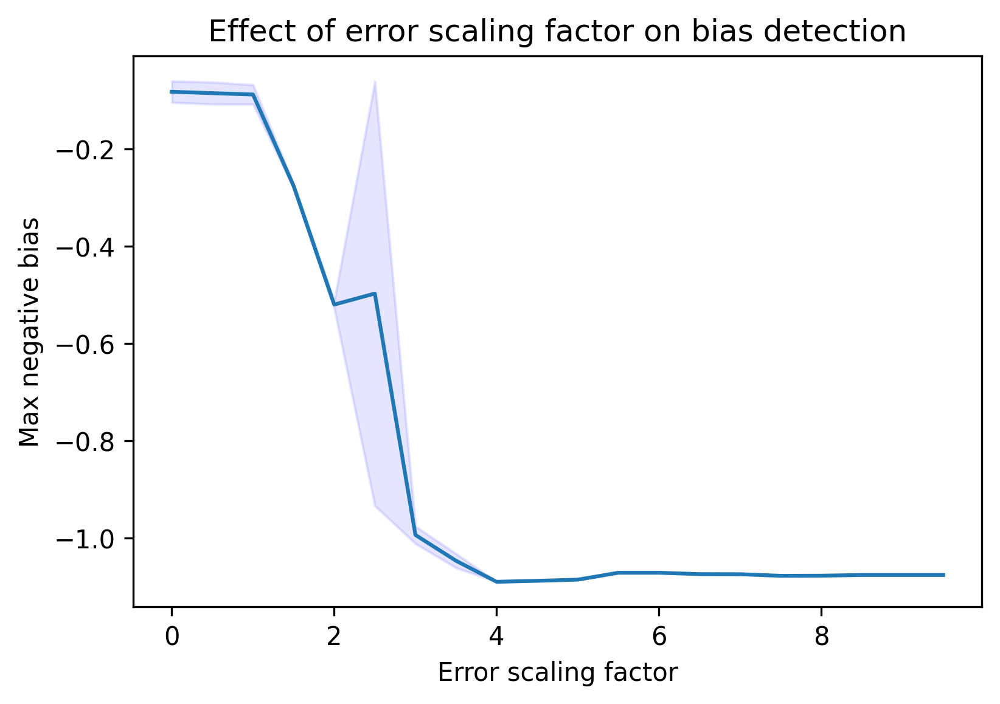

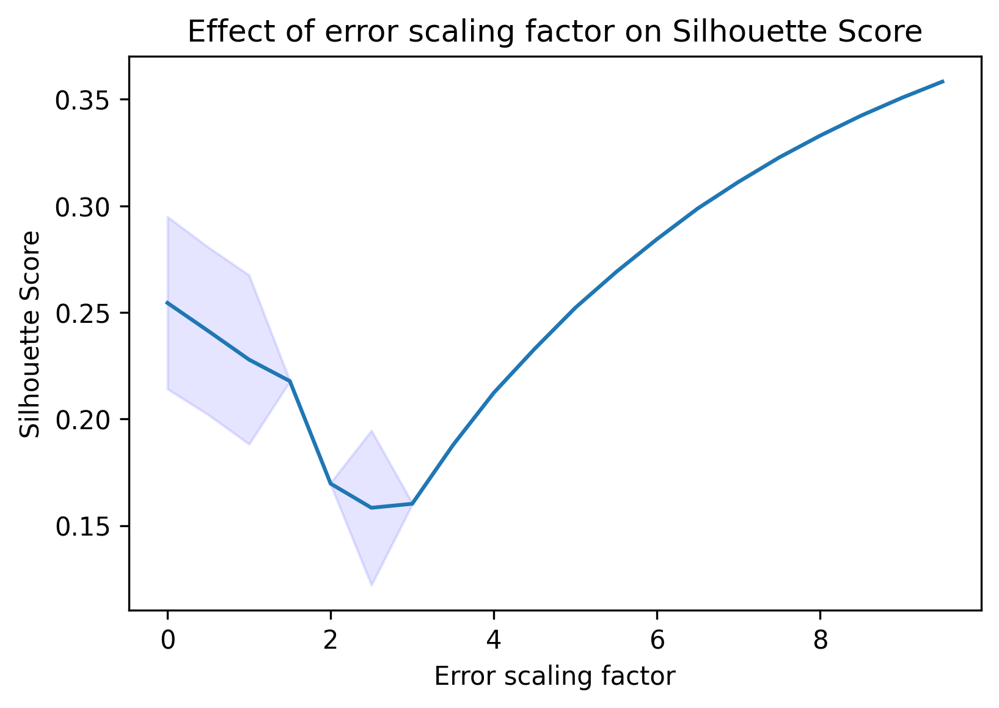

In [15]:
#### plot error scaling optimization

upper_std = (np.array(biases)+np.array(std))
lower_std = (np.array(biases)-np.array(std))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, biases)
plt.ylabel('Max negative bias')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on bias detection')
plt.show()

upper_std = (np.array(sillh_list)+np.array(std_sillh))
lower_std = (np.array(sillh_list)-np.array(std_sillh))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, sillh_list)
plt.ylabel('Silhouette Score')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on Silhouette Score')
plt.show()


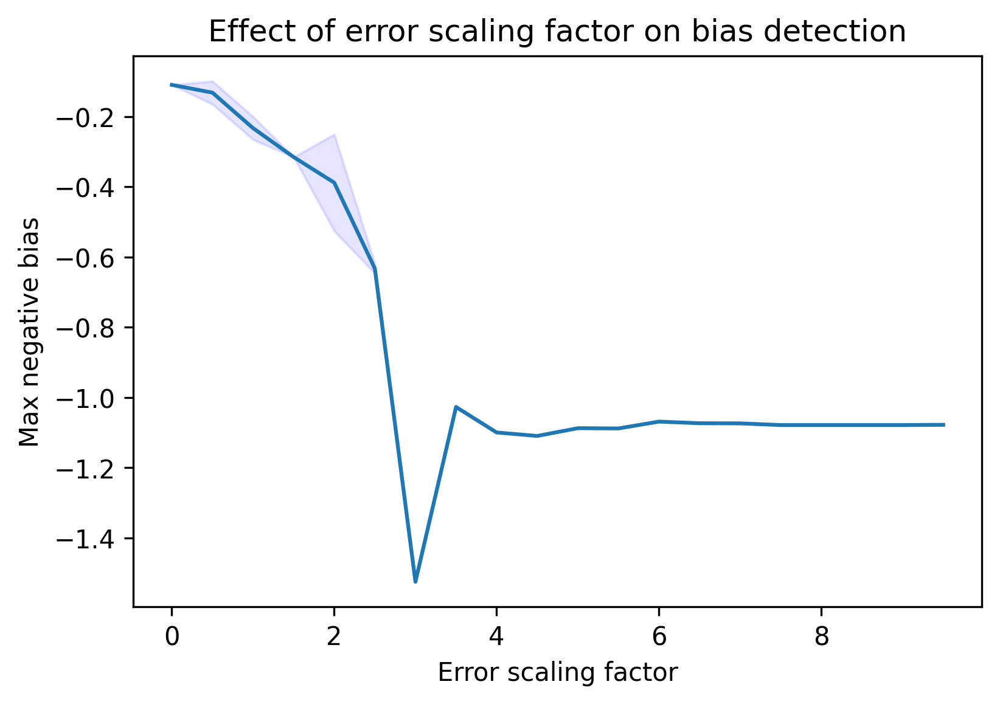

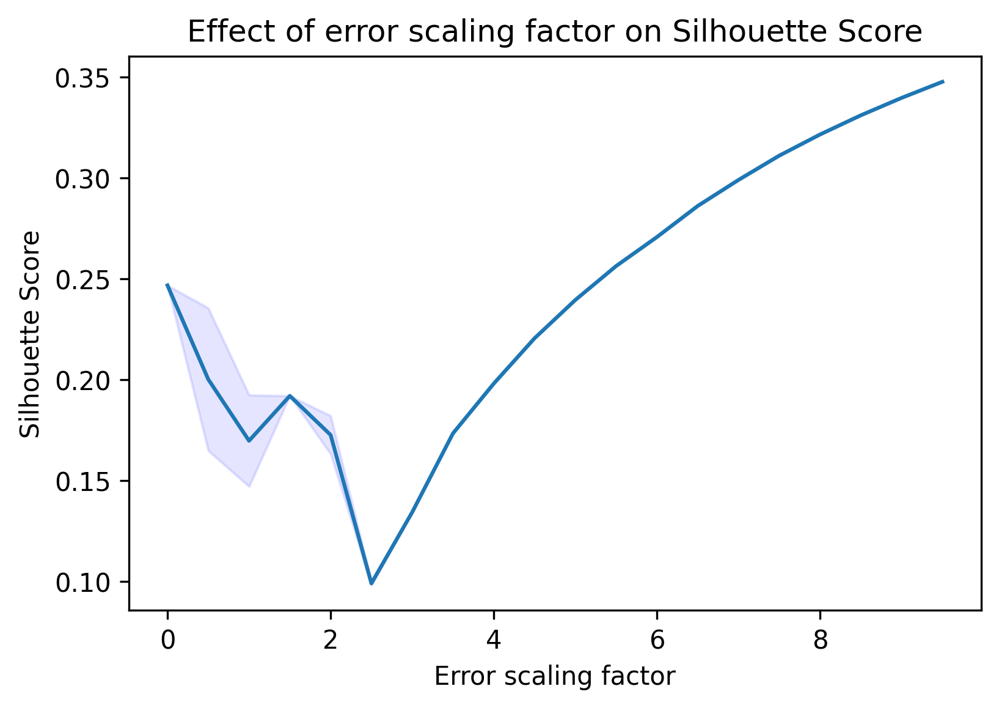

In [112]:
#### Error scaling factor optimization


df = pd.read_pickle('completed_dataset.pkl')


from statistics import mean
biases = []
std = []
sillh_list = []
std_sillh = []
# DB_list = []
# CH_list = []
scaling_factors = np.arange(0,10,0.5)

for error_scaling_factor in scaling_factors:
    avg_bias = []
    avg_sillh = []
    for i in range(3):
        results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor, show_plot=False)
        c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
        avg_bias.append(max_neg_bias)
        
        avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                              results['clusters']))
        
#         DB_score = metrics.davies_bouldin_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
#         CH_index = metrics.calinski_harabasz_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
        
    biases.append(mean(avg_bias))
    std.append(np.std(avg_bias))
    sillh_list.append(mean(avg_sillh))
    std_sillh.append(np.std(avg_sillh))




#### plot error scaling optimization
upper_std = (np.array(biases)+np.array(std))
lower_std = (np.array(biases)-np.array(std))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, biases)
plt.ylabel('Max negative bias')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on bias detection')
plt.show()

upper_std = (np.array(sillh_list)+np.array(std_sillh))
lower_std = (np.array(sillh_list)-np.array(std_sillh))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, sillh_list)
plt.ylabel('Silhouette Score')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on Silhouette Score')
plt.show()

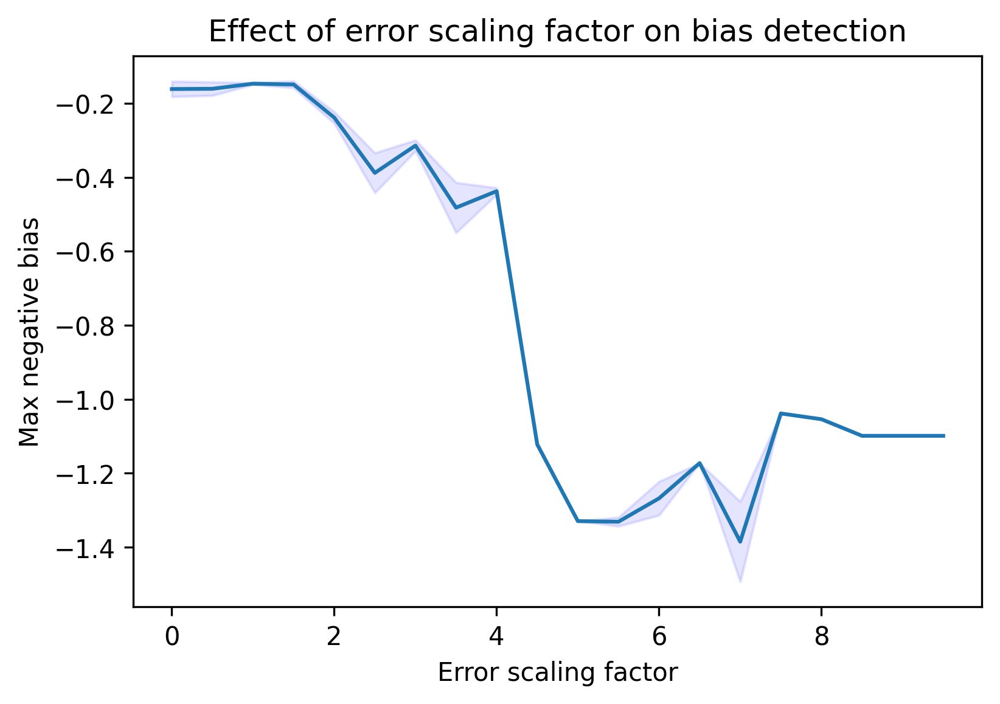

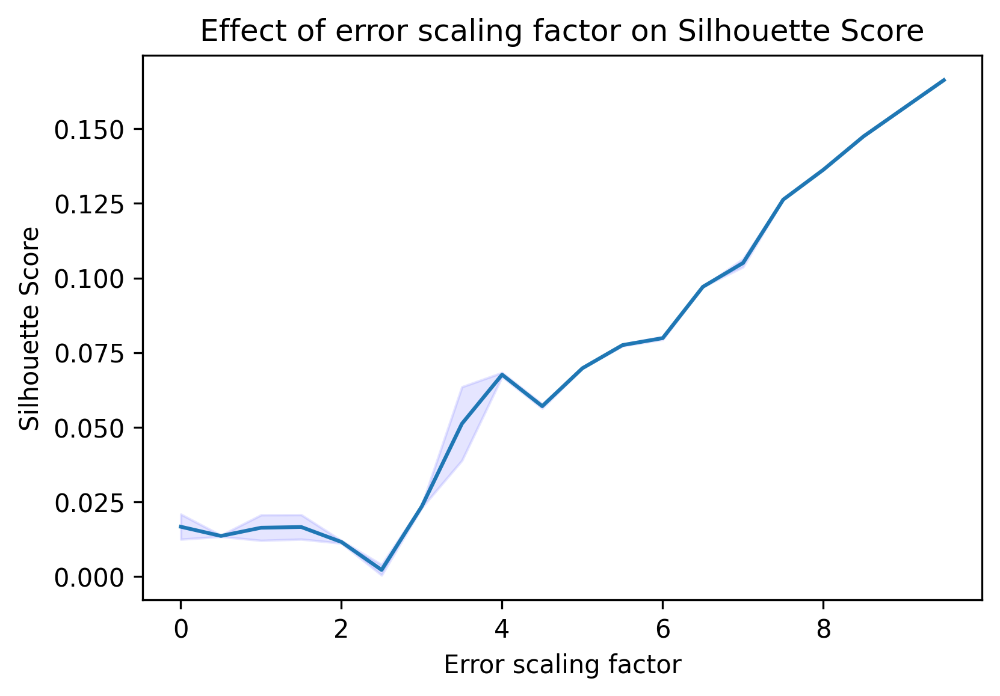

In [130]:
df = pd.read_pickle('full_db_completed_dataset.pkl')


from statistics import mean

biases = []
std = []
sillh_list = []
std_sillh = []
# DB_list = []
# CH_list = []
scaling_factors = np.arange(0,10,0.5)

for error_scaling_factor in scaling_factors:
    avg_bias = []
    avg_sillh = []
    for i in range(3):
        results = hbac_kmeans.hbac_kmeans(df, error_scaling_factor, show_plot=False)
        c, max_neg_bias = hbac_kmeans.get_max_bias_cluster(results)
        avg_bias.append(max_neg_bias)
        
        avg_sillh.append(metrics.silhouette_score( results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
                                              results['clusters']))
        
#         DB_score = metrics.davies_bouldin_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
#         CH_index = metrics.calinski_harabasz_score(results.drop(['clusters', 'new_clusters', 'predicted_value', 'true_value', 'errors'], axis=1),
#                                         results['clusters'])
        
    biases.append(mean(avg_bias))
    std.append(np.std(avg_bias))
    sillh_list.append(mean(avg_sillh))
    std_sillh.append(np.std(avg_sillh))




#### plot error scaling optimization
upper_std = (np.array(biases)+np.array(std))
lower_std = (np.array(biases)-np.array(std))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, biases)
plt.ylabel('Max negative bias')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on bias detection')
plt.show()

upper_std = (np.array(sillh_list)+np.array(std_sillh))
lower_std = (np.array(sillh_list)-np.array(std_sillh))
plt.fill_between(scaling_factors,lower_std, upper_std, color='b', alpha=.1)
plt.plot(scaling_factors, sillh_list)
plt.ylabel('Silhouette Score')
plt.xlabel('Error scaling factor')
plt.title('Effect of error scaling factor on Silhouette Score')
plt.show()